<a href="https://colab.research.google.com/github/valleyofdawn/TreeTag/blob/main/TreeTag_movie.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Single cell annotation pipline

## Prep

### Install missing libraries

In [ ]:
!pip install google-cloud-storage scanpy anndata mygene harmonypy igraph leidenalg scikit-misc --quiet

### load libraries

In [ ]:
from anndata import AnnData # for rading 10x format
from google.cloud import storage
from google.colab import auth, drive
from pathlib import Path # needed for multiple file input
from scipy import sparse as sp
from scipy.io import mmread
from scipy.sparse import issparse, csc_matrix, coo_matrix, dia_matrix, csr_matrix # for TreeTag
from scipy.stats import zscore, pearsonr, ttest_ind, ttest_rel # for leave-one-out marker pruning
from sklearn.decomposition import PCA
from sklearn.metrics import auc
from sklearn.preprocessing import StandardScaler, minmax_scale
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import multipletests
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from typing import Literal, Sequence, Tuple, Optional

import anndata as ad # needed throughout
import colorsys, gc, glob, gzip, h5py, harmonypy as hm, igraph as ig, io, matplotlib.pyplot as plt
import mygene as mg, numpy as np, openai, os, pandas as pd, re, requests, scanpy as sc, scipy.sparse as sp, seaborn as sns
import tarfile, textwrap, time, yaml


### Set variables

In [ ]:
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
set4 =  ['darkgreen', 'cornflowerblue', 'thistle', 'plum', 'orange',
    'magenta', 'lightgreen', 'tan', 'slateblue', 'gray', 'turquoise',
    'coral', 'lightgray', 'green', 'pink', 'gold', 'peru',
    'red', 'olive', 'lime', 'teal', 'violet',
    'orchid', 'beige', 'lightgrey', 'darkorange',
    'lightgreen', 'blue', 'wheat','darkred']
pastels= [
    '#aacc70', '#7080cc', '#78cc70', '#70cccc', '#cc7089', '#cc70bb',
    '#91cc70', '#c3cc70', '#cc8970', '#cc70a2', '#aa70cc', '#cc7070',
    '#70cc99', '#9170cc', '#7870cc', '#7099cc', '#ccbb70', '#70cc80',
    '#cca270', '#70ccb2', '#c370cc', '#70b2cc'
]


plt.rcParams['figure.figsize'] = (6, 6)
os.environ['LOKY_MAX_CPU_COUNT'] = '12'
pd.set_option('display.float_format', '{:.2e}'.format)

### Connect

In [ ]:
from google.colab import userdata
userdata.get('openai_client')
# os.chdir('/content/')
# print('Current working directory:', os.getcwd())
auth.authenticate_user()
client = storage.Client(project='Scanpy for Biolojic')
bucket = client.bucket('single_cell_h5ad_datasets')

### Function definitions

#### Fetch

In [ ]:
def fetch(filenames: list):
  """Downloads a list of files from the specified GCS bucket.

  Args:
    filenames: A list of strings, where each string is a filename in the GCS
      bucket.
  """
  if isinstance(filenames, str):
    filenames = [filenames]
  for filename in filenames:
    # Extract only the base filename
    base_filename = os.path.basename(filename)
    blob = bucket.blob(filename)
    # Download to /content/ with just the base filename
    blob.download_to_filename(f'/content/{base_filename}')

#### Palette from graph

In [115]:
def palette_from_graph(G, root, saturation=0.65, brightness=0.92,
                       leaves_only=False, order="name"):
    """
    Proportional hue allocation on a tree (igraph):
      - split parent's hue span among children by #descendant leaves
      - child ordering: 'name' (case-insensitive), 'size' (by subtree leaves, tie→name),
                        or 'ID' (by vertex index, ascending)
      - color = midpoint hue; S/V from args
    Returns: {node_name: '#RRGGBB'}
    """
    r_idx = G.vs.find(name=root).index

    # --- subtree leaf counts (single DFS from root) ---
    cnt = [0] * G.vcount()
    def dfs(u):
        kids = G.successors(u)
        cnt[u] = 1 if not kids else sum(dfs(v) for v in kids)
        return cnt[u]
    dfs(r_idx)

    # --- assign hue intervals recursively ---
    intervals = {}
    def assign(u_idx, h0, h1):
        intervals[u_idx] = (h0, h1)
        kids = G.successors(u_idx)
        if not kids:
            return
        if order == "size":
            kids = sorted(kids, key=lambda k: (-cnt[k], G.vs[k]["name"].casefold()))
        elif order == "name":
            kids = sorted(kids, key=lambda k: G.vs[k]["name"].casefold())
        elif order == "ID" or order == "id":
            kids = sorted(kids)  # vertex indices ascending
        else:
            raise ValueError("order must be 'name', 'size', or 'ID'")
        total = sum(cnt[k] for k in kids) or 1
        cur = h0
        for k in kids:
            frac = cnt[k] / total
            nxt = cur + (h1 - h0) * frac
            assign(k, cur, nxt)
            cur = nxt

    assign(r_idx, 0.0, 1.0)

    # --- HSV→hex at midpoint hue ---
    def hsv_hex(h, s, v):
        r, g, b = colorsys.hsv_to_rgb(h % 1.0, max(0, min(1, s)), max(0, min(1, v)))
        return "#{:02X}{:02X}{:02X}".format(int(round(r*255)),
                                            int(round(g*255)),
                                            int(round(b*255)))

    out = {}
    for vid, (h0, h1) in intervals.items():
        if leaves_only and G.outdegree(vid) > 0:
            continue
        out[G.vs[vid]["name"]] = hsv_hex((h0 + h1) / 2.0, saturation, brightness)
    return out

#### Find Markers

In [ ]:
def markers(cell_type, sign='pos', markers_yaml="markers.yaml", ontology_yaml="ontology.yaml", adata=None):
    if sign not in {'pos', 'neg'}:
        raise ValueError("sign must be 'pos' or 'neg'")

    # Re-load and normalize markers from YAML files
    _, normalized_markers = init_ontology(ontology_yaml, markers_yaml, root="root")

    if cell_type not in normalized_markers:
        print(f"⚠️ Cell type '{cell_type}' not found in marker definitions. Skipping.")
        return []

    markers_raw = normalized_markers[cell_type][sign]

    if adata is not None:
        var_names = adata.raw.var_names if getattr(adata, 'raw', None) is not None else adata.var_names
        present = [g for g in markers_raw if g in var_names]
        missing = [g for g in markers_raw if g not in var_names]
        for g in missing:
            print(f"⚠️ Marker '{g}' not found in data. Skipping.")
        return present

    return markers_raw


#### Subset data

In [ ]:
def subset(adata, column: str, value) -> 'AnnData':
    if adata.raw is None:
        raise ValueError('AnnData.raw is not set. Cannot subset raw data.')

    if column not in adata.obs.columns:
        raise KeyError(f"Column '{column}' not found in adata.obs.")

    mask = adata.obs[column] == value
    if mask.sum() == 0:
        raise ValueError(f"No cells found where adata.obs['{column}'] == {value!r}")

    adata_sub = adata[mask].copy()
    adata_sub.raw = adata.raw.to_adata()[mask].copy()
    return adata_sub


#### Convert to HGNC

In [ ]:
def convert(adata):
    """
    Convert var_names (and raw.var_names) from Ensembl or Entrez IDs to official gene symbols.
    Gene symbols and aliases are left unchanged.
    Stores original names in adata.var['original_gene'] and, if raw exists, in adata.raw.var['original_gene'].
    """
    import re
    import mygene as mg
    mg_client = mg.MyGeneInfo()

    sample = adata.var_names[:100]

    # ID patterns
    ensembl_pat = re.compile(r'ENSG\d{9}')
    entrez_pat = re.compile(r'^\d+$')

    n_ensembl = sum(bool(ensembl_pat.match(g)) for g in sample)
    n_entrez = sum(bool(entrez_pat.match(g)) for g in sample)

    def get_user_choice():
        print("🤔 Ambiguous gene ID format. Please choose ID type to convert from:")
        print("1: Ensembl")
        print("2: Entrez")
        print("0: Cancel")
        while True:
            choice = input("Enter 1, 2, or 0: ").strip()
            if choice in ('0', '1', '2'):
                return choice

    if n_ensembl > 50:
        print(f'🔄 Detected Ensembl IDs in {n_ensembl}/100 sampled genes — converting to symbols.')
        scopes = 'ensembl.gene'
    elif n_entrez > 50:
        print(f'🔄 Detected Entrez IDs in {n_entrez}/100 sampled genes — converting to symbols.')
        scopes = 'entrezgene'
    elif max(n_ensembl, n_entrez) < 10:
        print('❌ Less than 10% of sampled genes matched Ensembl or Entrez formats. No conversion performed.')
        return adata
    else:
        choice = get_user_choice()
        if choice == '0':
            print('🚫 Conversion cancelled by user.')
            return adata
        scopes = {'1': 'ensembl.gene', '2': 'entrezgene'}[choice]
        print(f'🔄 Converting using selected scope: {scopes}')

    # Run conversion
    results = mg_client.querymany(adata.var_names.tolist(), scopes=scopes, fields='symbol', species='human')
    mapping = {entry['query']: entry.get('symbol', entry['query']) for entry in results}

    # Store original gene names
    adata.var['original_gene'] = adata.var_names.copy()

    # Rename genes
    new_names = adata.var_names.map(lambda g: mapping.get(g, g))
    adata.var_names = new_names
    adata.var_names_make_unique()

    # Update raw if available
    if adata.raw is not None:
        adata.raw.var['original_gene'] = adata.raw.var_names.copy()
        adata.raw.var.index = adata.var_names.copy()

    num_changed = (adata.var['original_gene'] != adata.var_names).sum()
    print(f"✅ Conversion complete. {num_changed} gene names were changed.")
    return adata


#### Enrich

In [ ]:
def enrich (genes, type = 'cell', description='Example gene list'):
    if type == 'cell':
      library_list = [
      'Azimuth_2023',
      'CellMarker_2024',
      'HuBMAP_ASCTplusB_augmented_2022',
      'PanglaoDB_Augmented_2021',
      'Tabula_Sapiens']
    else:
      library_list = [
      'Reactome_Pathways_2024',
      'WikiPathways_2024_Human',
      'BioPlanet_2019',
      'KEGG_2021_Human',
      'Elsevier_Pathway_Collection']

    combined_results = []

    for library_name in library_list:
        time.sleep(1)  # Avoid rate limiting
        payload = {'list': '\n'.join(genes), 'description': description}
        response = requests.post('https://maayanlab.cloud/Enrichr/addList', files=payload)

        if response.status_code != 200:
            raise Exception('Error analyzing gene list:', response.text)

        user_list_id = response.json().get('userListId')
        results_url = f'https://maayanlab.cloud/Enrichr/enrich?userListId={user_list_id}&backgroundType={library_name}'
        enrichment_response = requests.get(results_url)

        if enrichment_response.status_code != 200:
            raise Exception('Error fetching enrichment results:', enrichment_response.text)

        enrichment_data = enrichment_response.json().get(library_name, [])
        if not enrichment_data:
            continue

        # Convert to dataframe
        results_df = pd.DataFrame([
            {
                'Library': library_name,
                'Term': row[1],
                'PValue': float(row[2]),
                'AdjustedPValue': float(row[6]),
                'OverlappingGenes': ', '.join(row[5])
            }
            for row in enrichment_data
        ])

        combined_results.append(results_df)

    if not combined_results:
        return pd.DataFrame()

    combined_df = pd.concat(combined_results, ignore_index=True)

    # Filter results
    combined_df = combined_df[combined_df['AdjustedPValue'] < 0.01]
    combined_df = combined_df[combined_df['OverlappingGenes'].str.split(', ').map(len) > 3]

    return combined_df

#### ChatGPT

In [ ]:
def ChatGPT(gene_set, cell_category, tissue, model='gpt-4o'):
    # Construct the prompt
    prompt = f'''
You are a biomedical expert. Based on your knowledge of gene expression and cellular specialization,
assess which {cell_category} in the {tissue} are most likely to differentially express the following gene set:

{', '.join(gene_set)}

Consider the gene set as a whole. Do not assess each gene individually.

List only the relevant cell types, each with a summary likelihood:
'very likely', 'possibly', or 'unlikely'.

Present your answer in this format:

- Cell_Type_A: very likely
- Cell_Type_B: possibly
'''

    # Query ChatGPT
    response = openai_client.chat.completions.create(
        model=model,
        messages=[{'role': 'user', 'content': prompt}],
        temperature=0.3
    )

    # Extract and parse text response
    text = response.choices[0].message.content
    lines = text.splitlines()

    # Filter and parse into tuples
    parsed = []
    for line in lines:
        if ':' in line:
            cell_type, likelihood = line.split(':', 1)
            parsed.append((cell_type.strip(' -*•'), likelihood.strip().lower()))

    # Sort by likelihood level
    likelihood_order = {'very likely': 0, 'possibly': 1, 'unlikely': 2}
    parsed_sorted = sorted(parsed, key=lambda x: likelihood_order.get(x[1], 3))

    # Convert to DataFrame
    df = pd.DataFrame(parsed_sorted, columns=['Cell Type', 'Likelihood'])
    return df

#### DGE computation

In [ ]:
def DGE(
    adata,
    target_group,
    reference_group,
    groupby,
    min_pct=None,
    min_log2fc=None,
    min_delta_pct=None,
    direction='pos',  # 'pos', 'neg', or 'both'
    n_genes=200,
    n_sample=None,
    return_df=False,
):
    """
    Differential Gene Expression for log-transformed data with optional Δpct and fold-change filters.
    Performs Welch's t-test and FDR correction. Assumes adata.raw is log-normalized data.
    """

    if direction not in ('pos', 'neg', 'both'):
        raise ValueError("direction must be one of 'pos', 'neg', or 'both'")
    if adata.raw is None:
        raise ValueError("`adata.raw` must be set before running DGE().")
    if isinstance(target_group, str):
        target_group = [target_group]

    labels = adata.obs[groupby].values
    tmask = np.isin(labels, target_group)
    rmask = ~tmask if reference_group == 'rest' else (labels == reference_group)

    def subsample(mask):
        idx = np.where(mask)[0]
        if n_sample is not None and len(idx) > n_sample:
            return np.random.choice(idx, size=n_sample, replace=False)
        return idx

    t_idx = subsample(tmask)
    r_idx = subsample(rmask)
    X = adata.raw.X
    var_names = adata.raw.var_names
    X_t = X[t_idx]
    X_r = X[r_idx]
    nt, nr = len(t_idx), len(r_idx)

    # Means and % expressing
    if sp.issparse(X):
        mean_t = X_t.mean(axis=0).A1
        mean_r = X_r.mean(axis=0).A1
        pct_t = X_t.getnnz(axis=0) / nt
        pct_r = X_r.getnnz(axis=0) / nr
        X_t_dense = X_t.toarray()
        X_r_dense = X_r.toarray()
    else:
        mean_t = X_t.mean(axis=0)
        mean_r = X_r.mean(axis=0)
        pct_t = (X_t > 0).mean(axis=0)
        pct_r = (X_r > 0).mean(axis=0)
        X_t_dense = X_t
        X_r_dense = X_r

    log2fc = mean_t - mean_r
    delta_pct = pct_t - pct_r

    # Filter before statistical test
    if direction == 'both':
        fc_mask = np.abs(log2fc) >= (min_log2fc or 0)
        dp_mask = np.abs(delta_pct) >= (min_delta_pct or 0)
    elif direction == 'pos':
        fc_mask = log2fc >= (min_log2fc or 0)
        dp_mask = delta_pct >= (min_delta_pct or 0)
    else:  # 'neg'
        fc_mask = log2fc <= -(min_log2fc or 0)
        dp_mask = delta_pct <= -(min_delta_pct or 0)

    pct_mask = pct_t >= (min_pct or 0)
    keep_mask = np.logical_and.reduce([pct_mask, fc_mask, dp_mask])
    kept = np.where(keep_mask)[0]

    if kept.size == 0:
        print("⚠️ No genes passed the filtering criteria.")
        return pd.DataFrame(columns=[
            'gene', 'mean_target', 'mean_ref',
            'pct_target', 'pct_ref', 'delta_pct',
            'log2fc', 'pval', 'pval_adj'
        ]) if return_df else []

    # Run t-tests only on filtered genes
    X_t_dense = X_t_dense[:, kept]
    X_r_dense = X_r_dense[:, kept]
    _, pvals = ttest_ind(X_t_dense, X_r_dense, axis=0, equal_var=False)
    pvals = np.asarray(pvals)

    # Adjust p-values
    adj_pvals = np.full_like(pvals, np.nan, dtype=np.float64)
    valid = ~np.isnan(pvals)
    if valid.sum() > 0:
        adj_pvals[valid] = multipletests(pvals[valid], method='fdr_bh')[1]
    else:
        print("⚠️ All p-values are NaN — no FDR correction performed.")

    # Assemble results
    df = pd.DataFrame({
        'gene': var_names[kept],
        'mean_target': mean_t[kept],
        'mean_ref': mean_r[kept],
        'pct_target': pct_t[kept],
        'pct_ref': pct_r[kept],
        'delta_pct': delta_pct[kept],
        'log2fc': log2fc[kept],
        'pval': pvals,
        'pval_adj': adj_pvals,
    })

    # Sort genes
    if direction == 'both':
        df = df.sort_values('pval')
    elif direction == 'neg':
        df = df.sort_values(['log2fc', 'pval'], ascending=[True, True])
    else:
        df = df.sort_values(['log2fc', 'pval'], ascending=[False, True])

    return df if return_df else df['gene'].head(n_genes).tolist()


#### get subscores

In [ ]:
def subscores(root_cell, adata,
              markers_yaml='markers.yaml',
              ontology_yaml='ontology.yaml'):

    G, _ = init_ontology(ontology_yaml, markers_yaml, root=root_cell)

    root_v = G.vs.find(name=root_cell)

    # all descendants (OUT reachability) and drop the root itself
    desc_idxs = G.subcomponent(root_v.index, mode='OUT')
    desc_idxs = [i for i in desc_idxs if i != root_v.index]
    desc_idxs = [i for i in desc_idxs if G.outdegree(i) == 0]

    nodes = [G.vs[i]['name'] for i in desc_idxs]

    existing, missing = [], []
    for n in nodes:
        col = f"{n}_score"
        (existing if col in adata.obs else missing).append(col)

    if missing:
        print(f"⚠️ Missing score columns: {missing}")
    return existing


#### Remove non-coding genes

In [ ]:
def coding_genes(adata, gene_id_type=None, chunk_size=1000):
    """
    Filter an AnnData object to retain only protein-coding genes.

    Parameters
    ----------
    adata : AnnData
        Input object.
    gene_id_type : str or None
        'symbol' (e.g. 'CD3D') or 'ensembl.gene' (e.g. 'ENSG00000167286').
        If None, it is guessed based on var_names.
    chunk_size : int
        Number of genes per MyGeneInfo query batch (max 1000).

    Returns
    -------
    AnnData with only protein-coding genes in .X (and .raw, if present).
    """
    import pandas as pd
    import numpy as np

    is_backed = adata.isbacked

    # --- Guess gene ID type if not provided ---
    if gene_id_type is None:
        ens_like = sum(g.startswith("ENS") for g in adata.var_names)
        gene_id_type = "ensembl.gene" if ens_like / len(adata.var_names) > 0.5 else "symbol"
    print(f"🔍 Querying MyGeneInfo with scope: '{gene_id_type}'")

    gene_list = adata.var_names.tolist()
    mg_client = mg.MyGeneInfo()

    # --- Query in chunks ---
    out = []
    for i in range(0, len(gene_list), chunk_size):
        chunk = gene_list[i:i + chunk_size]
        try:
            res = mg_client.querymany(
                chunk,
                scopes=gene_id_type,
                fields='type_of_gene',
                species='human',
                as_dataframe=True,
                df_index=True
            )
            out.append(res)
        except Exception as e:
            print(f"⚠️  Query failed on chunk {i}: {e}")

    df = pd.concat(out)

    # --- Keep clean hits only ---
    df = df[~df['notfound'].fillna(False)]
    if 'type_of_gene' not in df.columns:
        raise ValueError("❌ MyGeneInfo returned no 'type_of_gene' annotations.")

    # --- Map gene ID to biotype and create mask ---
    # Create a mapping from the full list of genes in adata.var_names
    full_gene_biotype_map = pd.Series(df['type_of_gene'].values, index=df.index).reindex(adata.var_names)
    coding_mask = full_gene_biotype_map == 'protein-coding'

    # Apply the mask to filter adata
    if is_backed:
        # Apply mask directly in backed mode
        adata_filtered = adata[:, coding_mask]
        print(f"✅ Filtered from {adata.n_vars} to {adata_filtered.n_vars} protein-coding genes (in backed mode).")
    else:
        # Apply mask to in-memory object
        adata_filtered = adata[:, coding_mask].copy()
        print(f"✅ Filtered from {adata.n_vars} to {adata_filtered.n_vars} protein-coding genes.")


    # --- Filter .raw if present ---
    if adata.raw is not None and isinstance(adata.raw, ad.AnnData):
        if adata.raw.isbacked and is_backed:
            # Match raw var_names to filtered var_names and apply mask in backed mode
            raw_var_names = adata.raw.var_names
            raw_coding_mask = raw_var_names.isin(adata_filtered.var_names)
            adata_filtered.raw = adata.raw[:, raw_coding_mask]
        else:
            # Convert raw to memory if needed and apply mask
            raw_adata_mem = adata.raw.to_adata() if adata.raw.isbacked else adata.raw
            raw_var_names = raw_adata_mem.var_names
            raw_coding_mask = raw_var_names.isin(adata_filtered.var_names)
            adata_filtered.raw = raw_adata_mem[:, raw_coding_mask].copy()


    return adata_filtered

#### QC computation

In [ ]:
def compute_qc (adata):
    if adata.raw is None:
        raise ValueError('adata.raw is not set.')

    X = adata.raw.X
    gene_names = adata.raw.var_names

    # Define gene masks
    mt_mask = gene_names.str.startswith('MT-')
    ribo_mask = gene_names.str.startswith(('RPS', 'RPL'))
    hsp_mask = gene_names.str.startswith(('HSP', 'DNAJ'))

    # Convert sparse to dense row sums if needed
    row_sum = X.sum(axis=1).A1 if sp.issparse(X) else X.sum(axis=1)
    gene_count = (X > 0).sum(axis=1).A1 if sp.issparse(X) else (X > 0).sum(axis=1)

    mt_sum = X[:, mt_mask].sum(axis=1).A1 if sp.issparse(X) else X[:, mt_mask].sum(axis=1)
    ribo_sum = X[:, ribo_mask].sum(axis=1).A1 if sp.issparse(X) else X[:, ribo_mask].sum(axis=1)
    hsp_sum = X[:, hsp_mask].sum(axis=1).A1 if sp.issparse(X) else X[:, hsp_mask].sum(axis=1)

    # Assign to .obs
    adata.obs['total_counts'] = row_sum
    adata.obs['n_genes_by_counts'] = gene_count
    adata.obs['pct_counts_mt'] = (mt_sum / row_sum) * 100
    adata.obs['pct_counts_ribo'] = (ribo_sum / row_sum) * 100
    adata.obs['pct_counts_hsp'] = (hsp_sum / row_sum) * 100

    return adata


#### Restore from raw

In [ ]:
def restore_from_raw(adata):
  # Step 1: Rebuild AnnData with full expression from .raw
  adata_full = ad.AnnData(
      X = adata.raw.X,
      obs = adata.obs.copy(),
      var = adata.raw.var.copy()
  )
  adata_full.var_names = adata.raw.var_names

  # Step 2: Add embeddings and annotations
  adata_full.obsm.update(adata.obsm)
  adata_full.obsp.update(adata.obsp)
  adata_full.uns.update(adata.uns)

  # Step 3: Set .raw (now safe since .X and .var are full)
  adata_full.raw = adata_full

  # Step 4: Replace
  adata = adata_full
  print(f"✅ Full X and raw restored. shape = {adata.shape}, raw = {adata.raw.shape}")
  adata_full=[]
  gc.collect()
  return (adata)

#### load 10x doublets

In [ ]:
# load 10x doublets
def load_10x_doublets (folder_path):
    folder = Path(folder_path)
    count_files = sorted(folder.glob('*count_matrix.tsv.gz'))
    adata_list = []

    for count_file in count_files:
        # Infer base name and metadata file
        base = re.sub(r'\.count_matrix\.tsv\.gz$', '', count_file.name)
        meta_file = folder / f'{base}.metadata.tsv.gz'
        if not meta_file.exists():
            print(f'Skipping {base}, no metadata file found.')
            continue

        # Load and orient counts
        counts = pd.read_csv(count_file, sep='\t', index_col=0)

        # Load metadata
        obs = pd.read_csv(meta_file, sep='\t', index_col=0)

        # Align
        counts = counts.loc[obs.index]

        # Harmonize metadata fields
        donor_match = re.search(r'RH\d+', base)
        stim_match = re.search(r'(rest|stim)', base)

        obs = obs.copy()
        obs['donor'] = donor_match.group(0) if donor_match else 'unknown'
        obs['in_vitro_stim'] = stim_match.group(1) if stim_match else 'unknown'
        obs['condition'] = 'T1D'
        obs['treatment'] = 'IL2'

        if 'disease_state' not in obs.columns:
            print(f"Warning: 'disease_state' column missing in {base}")

        # Build AnnData
        adata = sc.AnnData(X=counts.values, obs=obs, var=pd.DataFrame(index=counts.columns))
        adata.obs['sample_id'] = base
        adata_list.append(adata)

    if adata_list:
        return adata_list[0].concatenate(*adata_list[1:], batch_key='sample', index_unique=None)
    else:
        return None

#### Ontology & Marker Initialization

In [ ]:
def init_ontology(ontology_yaml: str, markers_yaml: str, root: str):
    """
    Load ontology and marker definitions.

    Returns:
        - G: an igraph.Graph representing the cell ontology hierarchy, used for recursive annotation and optional visualization.
        - normalized: a dictionary of markers per node (with 'pos' and 'neg' lists), used for scoring and pruning.

    The YAML files provide the editable source-of-truth; the graph and marker dict serve distinct internal purposes.
    """
    """
    Load ontology and marker definitions, return igraph and normalized marker dict.
    """
    with open(ontology_yaml, 'r') as f:
        ont = yaml.safe_load(f)
    with open(markers_yaml, 'r') as f:
        raw = yaml.safe_load(f)
    raw_markers = raw.get('markers', raw)

    # Build directed tree
    G = ig.Graph(directed=True)
    G.add_vertex(root)

    def find_subtree(d):
        if not isinstance(d, dict):
            return None
        if root in d:
            return d[root]
        for v in d.values():
            sub = find_subtree(v)
            if sub is not None:
                return sub
        return None

    subtree = find_subtree(ont)
    if subtree is None:
        raise KeyError(f"Root '{root}' not found in ontology '{ontology_yaml}'")

    def recurse(parent, branch):
        if not isinstance(branch, dict):
            return
        for child, grand in branch.items():
            if child.startswith('!'):
                continue
            if child not in G.vs['name']:
                G.add_vertex(child)
            G.add_edge(parent, child)
            recurse(child, grand or {})

    recurse(root, subtree)

    # Normalize markers
    normalized = {}
    for node, defs in raw_markers.items():
        if isinstance(defs, dict):
            pos = defs.get('pos', [])
            neg = defs.get('neg', [])
            if isinstance(pos, str): pos = [pos]
            if isinstance(neg, str): neg = [neg]
        elif isinstance(defs, list):
            pos = [g for g in defs if not g.startswith('-')]
            neg = [g.lstrip('-') for g in defs if g.startswith('-')]
        else:
            raise ValueError(f"Invalid markers for {node!r}: {defs!r}")
        normalized[node] = {'pos': pos, 'neg': neg}

    # Validate completeness
    subtree_indices = set(G.subcomponent(root, mode='OUT')) | {G.vs.find(name=root).index}
    subtree_names = {G.vs[i]['name'] for i in subtree_indices}
    missing = subtree_names - set(normalized)
    if missing:
        raise ValueError(f"Missing marker definitions for: {sorted(missing)}")

    # Attach marker lists as vertex attributes
    for v in G.vs:
        name = v['name']
        v['pos_markers'] = normalized[name]['pos']
        v['neg_markers'] = normalized[name]['neg']

    return G, normalized

#### Sanitize sparse

In [ ]:
def sanitize_sparse(adata):
    if sp.issparse(adata.X) and not isinstance(adata.X, sp.csr_matrix):
        adata.X = adata.X.tocsr()
    for k in adata.layers.keys():
        if sp.issparse(adata.layers[k]) and not isinstance(adata.layers[k], sp.csr_matrix):
            adata.layers[k] = adata.layers[k].tocsr()
    for k in adata.obsp.keys():
        if sp.issparse(adata.obsp[k]) and not isinstance(adata.obsp[k], sp.csr_matrix):
            adata.obsp[k] = adata.obsp[k].tocsr()

#### SC pipeline

In [ ]:
def pipeline(
    adata,
    sample_key='sample',
    n_top_genes=2000,
    exclude_xcr=True,
    harmony=True,
    convert_aliases=False,
    umap_min_dist=0.5,
    umap_spread=1.0,
    leiden_resolution=1.0,
    downsample_n: int | None = None
):
    print("🔄 Starting pipeline…")
    adata = convert (adata)
    # Step 1: Downsampling
    if downsample_n is not None and downsample_n < adata.n_obs:
        print(f"📉 Step 1: Downsampling to {downsample_n} cells…")
        idx = np.random.choice(adata.n_obs, downsample_n, replace=False)
        adata_sub = adata[idx].copy()
    else:
        print("➡️ Step 1: No downsampling.")
        adata_sub = adata

    # Step 2: Remove zero-sum genes
    print("🧹 Step 2: Filtering zero‐sum genes…")
    sums = np.ravel(adata.X.sum(axis=0)) if sp.issparse(adata.X) else adata.X.sum(axis=0)
    mask = (sums > 0) & (~np.isnan(sums))
    before = adata.n_vars
    adata = adata[:, mask].copy()
    adata_sub = adata_sub[:, mask].copy()
    gc.collect()
    print(f"   → {before} → {adata.n_vars} genes kept.")

    # Step 3: Optional gene alias conversion
    if convert_aliases:
        print("🔁 Step 3: Converting gene aliases…")
        adata = convert(adata)
        adata_sub = convert(adata_sub)
    else:
        print("⏭️ Step 3: Skipping alias conversion.")

    # Step 4: Normalize + log1p
    print("Step 4: Normalizing & log1p…")
    for ds, name in ((adata, 'full'), (adata_sub, 'subset')):
        if ds.X.max() > 100:
            sc.pp.normalize_total(ds, target_sum=1e4)
            sc.pp.log1p(ds)
            print(f"   - {name} normalized")
        else:
            print(f"   - {name} already transformed")

    # Step 4b: Cache normalized+log1p as raw
    cached_raw = adata.copy()
    cached_raw.raw = None
    adata.raw = cached_raw
    print("💾 Step 4b: Cached normalized+log1p data in adata.raw.")

    # Step 5: HVGs
    print("✨ Step 5: Selecting HVGs…")
    sc.pp.highly_variable_genes(adata_sub, n_top_genes=n_top_genes, flavor='seurat_v3', inplace=True)
    hvgs = adata_sub.var_names[adata_sub.var['highly_variable']].tolist()

    if exclude_xcr:
        bcr = adata.var_names.str.match(r'^IG[HKL]V')
        tcr = adata.var_names.str.match(r'^TR[ABGD]V')
        hvgs = [g for g in hvgs if not (bcr[adata.var_names.get_loc(g)] or tcr[adata.var_names.get_loc(g)])]
        print(f"   → Excluding BCR/TCR; {len(hvgs)} HVGs remain.")
    else:
        print(f"   → {len(hvgs)} HVGs selected.")

    adata = adata[:, hvgs].copy()
    adata_sub = adata_sub[:, hvgs].copy()

    # Step 6: PCA on subset, projection to full
    print("🧮 Step 6: Scaling + PCA…")
    sc.pp.scale(adata_sub, zero_center=True, max_value=10)
    sc.tl.pca(adata_sub, svd_solver='arpack', n_comps=50)
    print("   → PCA on subset complete.")

    # ⚠️ Fix: scale full data before projection
    sc.pp.scale(adata, zero_center=True, max_value=10)
    adata.obsm['X_pca'] = adata.X @ adata_sub.varm['PCs']
    print("   → Projected full dataset into PCA space.")

    # Step 7: Harmony (optional)
    rep = 'X_pca'
    if harmony:
        if sample_key not in adata.obs.columns:
            raise KeyError(f"Cannot run Harmony: '{sample_key}' not in adata.obs")

        print(f"🔀 Step 7: Running Harmony on '{sample_key}'…")

        if sp.issparse(adata.obsm['X_pca']):
            adata.obsm['X_pca'] = adata.obsm['X_pca'].toarray()

        nan_mask = np.isnan(adata.obsm['X_pca']).any(axis=1)
        if nan_mask.any():
            print(f"   ⚠️ Found {nan_mask.sum()} cells with NaNs — removing them before Harmony.")
            adata = adata[~nan_mask].copy()

        try:
            import harmonypy as hm
            ho = hm.run_harmony(adata.obsm['X_pca'], adata.obs, sample_key)
            adata.obsm['X_pca_harmony'] = ho.Z_corr.T
            rep = 'X_pca_harmony'
            print("   → Harmony integration complete.")
        except Exception as e:
            print(f"   ⚠️ Harmony failed ({e}); using PCA instead.")

    # Step 8–10: neighbors, UMAP, clustering
    sc.pp.neighbors(adata, use_rep=rep, n_pcs=50)
    print("🧭 Step 8: Neighbors calculated.")

    sc.tl.umap(adata, init_pos='random', min_dist=umap_min_dist, spread=umap_spread)
    print("🗺️ Step 9: UMAP computed.")

    sc.tl.leiden(adata, resolution=leiden_resolution, key_added='leiden_1', flavor="igraph", n_iterations=2)
    print("🧬 Step 10: Leiden clustering complete.")

    # Step 11–12: Restore raw and cleanup
    adata.raw = cached_raw
    print("♻️ Step 11: Restored adata.raw.")

    def sanitize_sparse(a):
        if sp.issparse(a.X):
            a.X.sort_indices()

    print("🧼 Step 12: Sanitizing sparse matrix…")
    sanitize_sparse(adata)

    print("✅ Pipeline complete.")
    return adata


#### TreeTag

In [ ]:
def TreeTag(
    adata,
    ontology_yaml: str,
    markers_yaml: str,
    root: str,
    min_marker_count: int = 2,
    verbose: bool = True,
    smoothing: bool = True,        # one-pass KNN score smoothing per split
    majority_vote: bool = True,    # optional single-pass label MV (always excludes self)
    save_scores: bool = False,     # persist per-split cell-type scores as "<child>_score"
    min_score: float = 0.0,        # gate final labels below this raw score as "unknown"
    prune: bool = True,            # enable pruning
    min_diff: float = 0.1,         # minimum mean gap (child - best sibling) for +markers
):
    """
    Hierarchical tagging with optional pruning.
    Always-on pre-scaling: each marker column is divided by its nonzero max (sparse-friendly),
    cached once per (n_obs, raw/X flag, marker union). Per split: skinny slice + matmuls + 1–99% scaling.
    Optional: KNN smoothing, majority vote, score persistence, and +marker pruning.
    Writes labels to adata.obs['TreeTag'] and logs per-split timings.
    """

    # ---------- load ontology + normalize markers ----------
    G, marker_dict = init_ontology(ontology_yaml, markers_yaml, root=root)
    use_raw = adata.raw is not None
    var_names = (adata.raw.var_names if use_raw else adata.var_names)
    valid = set(var_names)

    def _norm(md):
        out = {}
        for node, val in md.items():
            if isinstance(val, dict):
                pos = [g for g in val.get("pos", []) if g in valid]
                neg = [g for g in val.get("neg", []) if g in valid]
            else:
                pos = [g for g in val if not str(g).startswith("-") and g in valid]
                neg = [str(g)[1:] for g in val if str(g).startswith("-") and str(g)[1:] in valid]
            out[node] = {"pos": pos, "neg": neg}
        return out

    markers = _norm(marker_dict)
    ont_nodes = set(G.vs['name'])
    markers = {n: m for n, m in markers.items() if n in ont_nodes}
    marker_union = sorted({g for m in markers.values() for g in (m["pos"] + m["neg"])})

    # ---------- compact cache (hash + meta) ----------
    from hashlib import blake2b
    def _hash_names(names):
        h = blake2b(digest_size=16)
        for s in names:
            h.update(str(s).encode("utf-8")); h.update(b"\0")
        return h.hexdigest()

    def _get_scaled_marker_csc(adata, marker_union, use_raw, *, verbose=True):
        """Build (or fetch) a pre-scaled CSC: X[:, markers] / max_nonzero per column, float32."""
        want_meta = {
            "n_obs": int(adata.n_obs),
            "use_raw": bool(use_raw),
            "union_hash": _hash_names(marker_union),
            "version": 3,               # bumped: idempotent pre-scaled CSC
            "dtype": "float32",
            "format": "csc",
            "scale_mode": "max_nonzero",
        }
        cache = adata.uns.get("_treetag_cache", {})
        X_csc = cache.get("X_csc")
        have = cache.get("meta")
        if (have == want_meta and X_csc is not None and issparse(X_csc)
            and getattr(X_csc, "format", "") == "csc"
            and X_csc.dtype == np.float32
            and X_csc.shape == (adata.n_obs, len(marker_union))):
            return X_csc  # hot path

        # (re)build unscaled marker slice
        col_map = {g: i for i, g in enumerate(var_names)}
        cols = [col_map[g] for g in marker_union]
        Xsrc = (adata.raw.X if use_raw else adata.X)
        t0 = time.perf_counter()
        X_mark = Xsrc[:, cols]
        X_csc = X_mark if (issparse(X_mark) and X_mark.format == "csc") else csc_matrix(X_mark)
        if X_csc.dtype != np.float32:
            X_csc = X_csc.astype(np.float32)

        # compute per-column nonzero max directly from CSC internals; scale in-place
        indptr, data = X_csc.indptr, X_csc.data
        m = X_csc.shape[1]
        mx = np.zeros(m, dtype=np.float32)
        for j in range(m):
            seg = data[indptr[j]:indptr[j+1]]
            if seg.size:
                mx[j] = seg.max()
        nz = mx > 1e-12
        if nz.any():  # only touch columns that need scaling
            inv = np.zeros_like(mx)
            inv[nz] = 1.0 / mx[nz]
            for j in np.where(nz)[0]:
                data[indptr[j]:indptr[j+1]] *= inv[j]

        adata.uns["_treetag_cache"] = {"X_csc": X_csc, "meta": want_meta}
        if verbose:
            msg = "**pre-scaled**" if nz.any() else "pre-scaled (no scaling needed)"
            print(f"[TreeTag] prepared {msg} marker CSC in {time.perf_counter()-t0:.2f}s "
                  f"(cells={X_csc.shape[0]}, genes={X_csc.shape[1]})")
        return X_csc

    X_csc = _get_scaled_marker_csc(adata, marker_union, use_raw, verbose=verbose)
    g2col = {g: i for i, g in enumerate(marker_union)}

    def _children(node):
        return [G.vs[i]["name"] for i in G.successors(G.vs.find(name=node))]

    # ---------- row-normalized connectivities (CSR) for smoothing / MV ----------
    need_C = bool(smoothing or majority_vote)
    C_full = None
    if need_C:
        conn_key = adata.uns.get("neighbors", {}).get("connectivities_key")
        if conn_key and conn_key in adata.obsp:
            C_full = adata.obsp[conn_key]
        elif "connectivities" in adata.obsp:
            C_full = adata.obsp["connectivities"]
        if C_full is None:
            if verbose:
                print("[TreeTag] no connectivities found → disabling smoothing/majority_vote")
            smoothing = False
            majority_vote = False
        else:
            if C_full.shape[0] != adata.n_obs:
                if verbose:
                    print("[TreeTag] connectivities size mismatch → disabling smoothing/majority_vote")
                smoothing = False
                majority_vote = False
                C_full = None
            else:
                C_full = csr_matrix(C_full)
                rs = np.array(C_full.sum(axis=1)).ravel()
                rs[rs == 0] = 1.0
                C_full = C_full.multiply((1.0 / rs)[:, None]).tocsr()

    # ---------- per-node cache (skinny columns + weights) ----------
    node_cache = {}  # node -> dict(used_cols, child_list, child_score_names, W_pos, W_neg)

    def _prepare_node(node, kids):
        if node in node_cache:
            return node_cache[node]
        used_cols, seen = [], set()
        child_list, child_score_names, pos_lists, neg_lists = [], [], [], []
        for c in kids:
            pidx = [g2col[g] for g in markers[c]["pos"] if g in g2col]
            nidx = [g2col[g] for g in markers[c]["neg"] if g in g2col]
            if len(pidx) < max(1, min_marker_count):
                continue
            child_list.append(c)
            child_score_names.append(f"{c}_score")
            pos_lists.append(pidx)
            neg_lists.append(nidx)
            for gidx in pidx:
                if gidx not in seen: seen.add(gidx); used_cols.append(gidx)
            for gidx in nidx:
                if gidx not in seen: seen.add(gidx); used_cols.append(gidx)

        k = len(child_list)
        if k == 0:
            node_cache[node] = dict(used_cols=[], child_list=[], child_score_names=[], W_pos=None, W_neg=None)
            return node_cache[node]

        local_map = {g: i for i, g in enumerate(used_cols)}
        data_p, rows_p, cols_p = [], [], []
        data_n, rows_n, cols_n = [], [], []
        for j, (pidx, nidx) in enumerate(zip(pos_lists, neg_lists)):
            if pidx:
                w = 1.0 / float(len(pidx))
                rows_p.extend(local_map[g] for g in pidx)
                cols_p.extend([j] * len(pidx))
                data_p.extend([w] * len(pidx))
            if nidx:
                w = 1.0 / float(len(nidx))
                rows_n.extend(local_map[g] for g in nidx)
                cols_n.extend([j] * len(nidx))
                data_n.extend([w] * len(nidx))
        n_local = len(used_cols)
        W_pos = coo_matrix((data_p, (rows_p, cols_p)), shape=(n_local, k)).tocsr()
        W_neg = coo_matrix((data_n, (rows_n, cols_n)), shape=(n_local, k)).tocsr() if data_n else None

        node_cache[node] = dict(used_cols=used_cols, child_list=child_list,
                                child_score_names=child_score_names, W_pos=W_pos, W_neg=W_neg)
        return node_cache[node]

    # ---------- pruning helper (positive markers only) ----------
    def _prune_pos_markers_min_diff(row_idx, child_list, child_assignments):
        """
        Returns:
          kept_pos: dict(child -> list[int global_col_idx kept])
          pruned_log: dict(child -> list[str gene names pruned])
        Raises ValueError if any child keeps < min_marker_count.
        """
        if (not prune) or (min_diff <= 0.0) or len(child_list) <= 1 or row_idx.size == 0:
            kept = {c: [g2col[g] for g in markers[c]["pos"] if g in g2col] for c in child_list}
            return kept, {c: [] for c in child_list}

        pos_by_child = {c: [g2col[g] for g in markers[c]["pos"] if g in g2col] for c in child_list}
        union_cols = sorted({g for lst in pos_by_child.values() for g in lst})
        if not union_cols:
            if verbose:
                print("[Prune] No positive markers present at this split; skipping pruning.")
            kept = {c: [] for c in child_list}
            return kept, {c: [] for c in child_list}

        # slice (n_cells_split x |Gpos|)
        X_rows = X_csc[row_idx, :]              # CSR view
        Xg = X_rows[:, union_cols]              # CSR

        # One-hot assignment (n_cells_split x k)
        k = len(child_list)
        n = row_idx.size
        A = sp.csr_matrix((np.ones(n, dtype=np.float32),
                           (np.arange(n, dtype=int), child_assignments.astype(int))),
                          shape=(n, k))

        # Group means (k x |Gpos|)
        group_sums = A.T @ Xg                   # (k x |Gpos|)
        counts = np.asarray(A.sum(axis=0)).ravel().astype(float)
        with np.errstate(invalid="ignore", divide="ignore"):
            means = group_sums.toarray() / counts[:, None]  # NaN where count==0
        means_f = np.where(np.isfinite(means), means, -np.inf)

        # Global max and second max per gene (|Gpos|)
        argmax = np.argmax(means_f, axis=0)
        max1 = means_f[argmax, np.arange(means_f.shape[1])]
        tmp = means_f.copy()
        tmp[argmax, np.arange(tmp.shape[1])] = -np.inf
        max2 = np.max(tmp, axis=0)

        union_pos = {col: i for i, col in enumerate(union_cols)}
        kept_pos, pruned_log = {}, {}
        hard_min = int(max(2, min_marker_count))  # enforce at least 2 by spec

        for c_idx, c in enumerate(child_list):
            cols_c = pos_by_child[c]
            if counts[c_idx] == 0 or not cols_c:
                kept_pos[c] = cols_c[:]
                pruned_log[c] = []
                if verbose:
                    why = "0 cells assigned" if counts[c_idx] == 0 else "no candidate +markers present"
                    print(f"[Prune] {c}: skipped pruning ({why}). Kept {len(cols_c)} markers.")
                continue

            pos_idx_in_union = [union_pos[col] for col in cols_c]
            sib_max = np.where(argmax[pos_idx_in_union] == c_idx,
                               max2[pos_idx_in_union], max1[pos_idx_in_union])
            diffs = means[c_idx, pos_idx_in_union] - sib_max
            keep_mask = diffs >= float(min_diff)

            kept_cols = [col for col, keep in zip(cols_c, keep_mask) if keep]
            drop_cols = [col for col, keep in zip(cols_c, keep_mask) if not keep]
            kept_pos[c] = kept_cols
            pruned_log[c] = [marker_union[col] for col in drop_cols]

            if verbose:
                print(f"[Prune] {c}: kept {len(kept_cols)}/{len(cols_c)} (+markers, min_diff={min_diff:g}).")
                if pruned_log[c]:
                    print("         pruned → " + ", ".join(pruned_log[c]))

            if len(kept_cols) < hard_min:
                msg = (f"[Prune:STOP] {c} has {len(kept_cols)} positive markers after pruning "
                       f"(min required = {hard_min}). Lower min_diff or review markers.")
                if verbose:
                    print(msg)
                raise ValueError(msg)

        return kept_pos, pruned_log

    # ---------- per-split scoring (with optional pruning) ----------
    def _score_children_rows(row_idx, node, kids):
        cache = _prepare_node(node, kids)
        used_cols = cache["used_cols"]
        child_list = cache["child_list"]
        child_score_names = cache["child_score_names"]
        W_pos, W_neg = cache["W_pos"], cache["W_neg"]

        if not child_list:
            return [], [], np.zeros((row_idx.size, 0), dtype=np.float32), 0

        # First-pass scoring (no pruning)
        X_used = X_csc[:, used_cols][row_idx, :].tocsr()
        P = X_used @ W_pos
        N = (X_used @ W_neg) if W_neg is not None else 0

        P = P.toarray() if hasattr(P, "toarray") else np.asarray(P)
        if hasattr(N, "toarray"):
            N = N.toarray()
        elif isinstance(N, int):
            pass
        else:
            N = np.asarray(N)

        Diff = P - (N if isinstance(N, int) else N)
        np.clip(Diff, 0, None, out=Diff)

        # 1–99% split-wise quantile normalization → [0,1]
        q = np.quantile(Diff, [0.01, 0.99], axis=0)
        q1, q99 = q[0], q[1]
        denom = (q99 - q1 + 1e-9)
        S = (Diff - q1) / denom
        np.clip(S, 0, 1, out=S)
        S = S.astype(np.float32, copy=False)

        # Optional pruning based on this first pass
        if prune and (min_diff > 0.0) and len(child_list) > 1:
            best = S.argmax(axis=1)
            kept_pos, _ = _prune_pos_markers_min_diff(row_idx, child_list, best)

            pos_lists_pruned = [kept_pos[c] for c in child_list]
            neg_lists = [[g2col[g] for g in markers[c]["neg"] if g in g2col] for c in child_list]

            seen, used_cols2 = set(), []
            for lst in pos_lists_pruned + neg_lists:
                for gidx in lst:
                    if gidx not in seen:
                        seen.add(gidx); used_cols2.append(gidx)

            if not used_cols2:
                return child_list, child_score_names, np.zeros((row_idx.size, 0), dtype=np.float32), 0

            local_map = {g: i for i, g in enumerate(used_cols2)}
            data_p, rows_p, cols_p = [], [], []
            data_n, rows_n, cols_n = [], [], []
            for j, (pidx, nidx) in enumerate(zip(pos_lists_pruned, neg_lists)):
                if pidx:
                    w = 1.0 / float(len(pidx))
                    rows_p.extend(local_map[g] for g in pidx)
                    cols_p.extend([j] * len(pidx))
                    data_p.extend([w] * len(pidx))
                if nidx:
                    w = 1.0 / float(len(nidx))
                    rows_n.extend(local_map[g] for g in nidx)
                    cols_n.extend([j] * len(nidx))
                    data_n.extend([w] * len(nidx))
            n_local2 = len(used_cols2)
            W_pos2 = coo_matrix((data_p, (rows_p, cols_p)), shape=(n_local2, len(child_list))).tocsr()
            W_neg2 = coo_matrix((data_n, (rows_n, cols_n)), shape=(n_local2, len(child_list))).tocsr() if data_n else None

            # re-score with pruned weights (X_csc already pre-scaled)
            X_used2 = X_csc[:, used_cols2][row_idx, :].tocsr()
            P2 = X_used2 @ W_pos2
            N2 = (X_used2 @ W_neg2) if W_neg2 is not None else 0

            P2 = P2.toarray() if hasattr(P2, "toarray") else np.asarray(P2)
            if hasattr(N2, "toarray"):
                N2 = N2.toarray()
            elif isinstance(N2, int):
                pass
            else:
                N2 = np.asarray(N2)

            Diff2 = P2 - (N2 if isinstance(N2, int) else N2)
            np.clip(Diff2, 0, None, out=Diff2)

            q = np.quantile(Diff2, [0.01, 0.99], axis=0)
            q1, q99 = q[0], q[1]
            denom = (q99 - q1 + 1e-9)
            S2 = (Diff2 - q1) / denom
            np.clip(S2, 0, 1, out=S2)
            S = S2.astype(np.float32, copy=False)   # replace S
            used_cols = used_cols2                  # for logging

        # Optional smoothing (applies to either initial or pruned S)
        if smoothing and C_full is not None and S.shape[1] > 0:
            C_sub = C_full[row_idx, :][:, row_idx].tocsr()
            C_sub.setdiag(0.0)  # exclude self
            rs = np.array(C_sub.sum(axis=1)).ravel()
            rs[rs == 0] = 1.0
            C_sub = C_sub.multiply((1.0 / rs)[:, None]).tocsr()
            S = C_sub @ S

        return child_list, child_score_names, S, len(used_cols)

    # ---------- recursion + logs ----------
    labels = pd.Series(index=adata.obs_names, dtype=object)
    n_obs = adata.n_obs
    winner_score = np.full(n_obs, np.nan, dtype=np.float32)
    created_cols = set()

    def _save_split_scores(score_names, row_idx, S):
        if not save_scores or not score_names:
            return
        for j, col in enumerate(score_names):
            if col not in created_cols:
                adata.obs[col] = np.zeros(n_obs, dtype=np.float32)
                created_cols.add(col)
            adata.obs[col].values[row_idx] = S[:, j]

    def _walk(node, row_idx):
        kids = [k for k in _children(node) if k in markers]
        if not kids or row_idx.size == 0:
            labels.iloc[row_idx] = node
            return
        t0 = time.perf_counter()
        child_names, child_score_names, S, n_local = _score_children_rows(row_idx, node, kids)
        t1 = time.perf_counter()
        if verbose:
            print(f"[TreeTag] split @ '{node}' (cells={row_idx.size}, "
                  f"X_used={row_idx.size}x{n_local}, score={t1 - t0:.2f}s, "
                  f"children_scored={len(child_names)})")
        if S.shape[1] == 0:
            labels.iloc[row_idx] = node
            return
        _save_split_scores(child_score_names, row_idx, S)
        best = S.argmax(axis=1)
        for j, child in enumerate(child_names):
            mask = (best == j)
            if mask.any():
                winner_score[row_idx[mask]] = S[mask, j]
                _walk(child, row_idx[mask])

    t_start = time.perf_counter()
    _walk(root, np.arange(adata.n_obs, dtype=int))
    if verbose:
        print(f"[TreeTag] total {time.perf_counter() - t_start:.2f}s")

    # finalize labels
    labels = labels.fillna("unidentified")
    cats = pd.Index(pd.unique(labels.values))
    adata.obs["TreeTag"] = pd.Categorical(labels.values, categories=cats)

    # ---------- optional majority vote ----------
    if majority_vote:
        if C_full is None:
            conn_key = adata.uns.get("neighbors", {}).get("connectivities_key")
            if conn_key and conn_key in adata.obsp:
                C_full = adata.obsp[conn_key]
            elif "connectivities" in adata.obsp:
                C_full = adata.obsp["connectivities"]
            if C_full is not None and C_full.shape[0] == adata.n_obs:
                C_full = csr_matrix(C_full)
                rs = np.array(C_full.sum(axis=1)).ravel()
                rs[rs == 0] = 1.0
                C_full = C_full.multiply((1.0 / rs)[:, None]).tocsr()
            else:
                C_full = None

        if C_full is not None:
            label_to_idx = {lab: i for i, lab in enumerate(cats)}
            idx = np.fromiter((label_to_idx.get(lab, -1) for lab in adata.obs["TreeTag"].astype(str).values), dtype=int)
            rows = np.where(idx >= 0)[0]
            cols = idx[idx >= 0]
            data = np.ones(rows.size, dtype=np.float32)
            OH = csr_matrix((data, (rows, cols)), shape=(adata.n_obs, len(cats)))

            C_mv = C_full.tocsr(copy=True)
            C_mv.setdiag(0.0)  # exclude self
            rs = np.array(C_mv.sum(axis=1)).ravel()
            rs[rs == 0] = 1.0
            C_mv = C_mv.multiply((1.0 / rs)[:, None]).tocsr()

            votes = C_mv @ OH
            best_idx = votes.argmax(axis=1).A1
            new_labels = np.array(cats)[best_idx]
            adata.obs["TreeTag"] = pd.Categorical(new_labels, categories=cats)

    # ---------- post-smoothing unknown gate ----------
    if (min_score is not None) and (float(min_score) > 0.0):
        final_labels = adata.obs["TreeTag"].astype(object).to_numpy()
        n = final_labels.size
        chosen = np.full(n, np.nan, dtype=np.float32)

        unique_final = pd.unique(final_labels)
        for lab in unique_final:
            if lab is None:
                continue
            col = f"{lab}_score"
            if col in adata.obs:
                vals = adata.obs[col].to_numpy(dtype=np.float32, copy=False)
                m = (final_labels == lab)
                chosen[m] = vals[m]

        # fallback to raw winner_score where we didn't persist scores
        missing = ~np.isfinite(chosen)
        if missing.any():
            tmp = winner_score.copy()
            tmp[~np.isfinite(tmp)] = -np.inf
            chosen[missing] = tmp[missing]

        unk = chosen < float(min_score)
        if np.any(unk):
            new_vals = final_labels.copy()
            new_vals[unk] = "unknown"
            cats = list(adata.obs["TreeTag"].cat.categories)
            if "unknown" not in cats:
                cats.append("unknown")
            adata.obs["TreeTag"] = pd.Categorical(new_vals, categories=cats)


#### Ontology Visualization

In [112]:
# === Ontology tree plotting function ===
def plot_ontology(
    G,
    root=None,
    vertex_size=20,
    vertex_label_size=10,
    bbox=(800,800),
    margin=50,
    palette=None,          # dict | callable(G, root)->dict | "auto"/None
    wrap_width=6
):
    """
    Plot a cell ontology tree using igraph.
    - Colors are assigned from `palette` (dict or callable). If None or "auto",
      colors are generated by palette_from_graph(G, root).
    """
    # labels
    names = G.vs['name']
    wrapped = [textwrap.fill(n.replace('_',' '), width=wrap_width, break_long_words=True) for n in names]

    # layout
    if root is not None:
        ridx = G.vs.find(name=root).index
        layout = G.layout_reingold_tilford(root=[ridx], mode='out')
    else:
        layout = G.layout_reingold_tilford(mode='out')
    coords = [(x, -y) for x, y in layout]  # flip Y for top-down

    # colors
    if palette is None or palette == "auto":
        if root is None:
            raise ValueError("palette='auto' requires `root` to be set.")
        pal = palette_from_graph(G, root)
    elif callable(palette):
        pal = palette(G, root)
    elif isinstance(palette, dict):
        pal = palette
    else:
        raise TypeError("palette must be dict, callable, None, or 'auto'.")

    vcols = [pal.get(n, "#add8e6") for n in names]  # default to lightblue if missing

    # plot
    dpi = plt.rcParams.get('figure.dpi', 100)
    fig, ax = plt.subplots(figsize=(bbox[0]/dpi, bbox[1]/dpi))
    ax.set_axis_off()
    ig.plot(
        G.as_undirected(),
        target=ax,
        layout=coords,
        vertex_label=wrapped,
        vertex_size=vertex_size,
        vertex_label_size=vertex_label_size,
        margin=margin,
        edge_color="gray",
        vertex_color=vcols,              # <- use palette here
        vertex_frame_color="dimgray",
    )
    plt.tight_layout()
    plt.show()


### Download YAMLs

In [ ]:
fetch(['ontology.yaml','ontology_TIL.yaml','markers.yaml','coarse.yaml', 'notes.txt'])

## Load Data

### Load from gcs

In [ ]:
# gc.collect ()
fetch ("Dong/Dong.h5ad")
adata = sc.read_h5ad ('/content/Dong.h5ad')
G, normalized_markers = init_ontology('coarse.yaml', 'markers.yaml', root='root')
globals()['normalized_markers'] = normalized_markers
globals()['G'] = G

In [ ]:
sc.pp.neighbors(adata)

### Load .h5ad file from drive

In [ ]:
# Load .h5ad file
# adata = sc.read_h5ad('/content/drive/MyDrive/Documents/COVID19_ALL.h5ad', backed='r') # Load only metadata (not full matrix)
adata = sc.read_h5ad('/content/drive/MyDrive/Documents/SjD.h5ad')

# print(adata.obs.columns)
# print(adata.obs.head())
# adata = sc.read_10x_mtx('C:/Users/User/decidua/sick', var_names='gene_symbols', cache=True) # Load from folder with 3 10x files

In [ ]:
# Select cells where 'celltype' is 'T_CD4_c12-FOXP3'
# adata_backed = sc.read_h5ad('/content/drive/MyDrive/Documents/COVID19_ALL.h5ad', backed='r') # Load only metadata (not full matrix)
# treg_ids = adata_backed.obs[adata_backed.obs["celltype"] == "T_CD4_c12-FOXP3"].index
adata = adata_backed[treg_ids, :].to_memory()

### Load from URL

In [ ]:

# Step 1: Download the file
url = 'https://datasets.cellxgene.cziscience.com/a01a3c7a-14bc-4a34-8a98-d204c0a4de00.h5ad'
filename = 'covid_PBMC.h5ad'

if not os.path.exists(filename):  # Avoid re-downloading
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(filename, 'wb') as f:
            for chunk in r.iter_content(chunk_size=1024 * 1024):
                f.write(chunk)

# Step 2: Open in backed mode
adata = sc.read_h5ad (filename)

# # Step 3: Create mask for lineage == "TNK"
# mask = adata_backed.obs['lineage'] == 'TNK'

# # Step 4: Subset and load into memory
# adata_tnk = adata_backed[mask].to_memory()

# # Step 5: Done!
# print(adata_tnk)


### load 10x triplets

In [ ]:
data_dir = '/content/drive/MyDrive/Documents/uveal_melanoma'   # ← your folder
prefixes = sorted({ '_'.join(os.path.basename(f).split('_')[:2])
                    for f in glob.glob(os.path.join(data_dir, '*_matrix.mtx.gz')) })

adata_all, adata, adatas, timings = [], [], [], []

for p in prefixes:
    t0 = time.time()
    matrix_f   = os.path.join(data_dir, f'{p}_matrix.mtx.gz')
    barcodes_f = os.path.join(data_dir, f'{p}_barcodes.tsv.gz')
    genes_f    = os.path.join(data_dir, f'{p}_genes.tsv.gz')
    print(f'⏳ Reading {p} …')

    # --- (A) simplest: use Scanpy's 10x reader on‑the‑fly -------------------
    adata = sc.read_mtx(matrix_f).T                # cells as rows
    adata.var_names = pd.read_csv(genes_f, header=None, sep='\t')[0].values
    adata.obs_names = pd.read_csv(barcodes_f, header=None)[0].values

    # metadata
    gsm_id, sample_id = p.split('_', 1)
    adata.obs['gsm_id']    = gsm_id
    adata.obs['sample_id'] = sample_id
    adata.obs['source']    = p

    adatas.append(adata)
    print(f'   ✅ {adata.n_obs} cells × {adata.n_vars} genes '
          f'({time.time()-t0:.1f}s)')

# ---------- concatenate every sample ----------------------------------------
print('\n🔗 Concatenating …')
adata_all = ad.concat(adatas,
                      label='sample',
                      keys=[a.obs["source"][0] for a in adatas],
                      index_unique='-')
print(f'🎉 Done: {adata_all.shape} total')


### Load 10x format

In [ ]:
# Set base directory
data_dir = '/content/drive/MyDrive/Documents/adataelanoma'

# Locate matrix files
matrix_files = glob.glob(os.path.join(data_dir, '*_matrix.mtx.gz'))

# Extract sample info
sample_metadata = []
pattern = re.compile(r'^(GSM\d+)_MEL(\d+)_(TIL|PBMC)_matrix\.mtx\.gz$')

for path in matrix_files:
    filename = os.path.basename(path)
    match = pattern.match(filename)
    if match:
        gsm, mel_num, tissue = match.groups()
        prefix = filename.replace('_matrix.mtx.gz', '_')  # ✅ trailing underscore included
        sample_metadata.append({
            "sample": f"MEL{mel_num}_{tissue}",
            "gsm": gsm,
            "mel_id": f"MEL{mel_num}",
            "tissue": tissue,
            "prefix": prefix
        })

# Load datasets
adatas = []
timings = []

for meta in sample_metadata:
    prefix = meta["prefix"]
    print(f"⏳ Reading {prefix}...")
    start = time.time()

    try:
        adata = sc.read_10x_mtx(
            data_dir,
            var_names='gene_symbols',
            cache=False,
            prefix=prefix
        )

        # Add metadata
        for k, v in meta.items():
            adata.obs[k] = v

        adatas.append(adata)
        duration = time.time() - start
        print(f"✅ Loaded {adata.n_obs} cells, {adata.n_vars} genes in {duration:.2f} sec")
        timings.append((meta["sample"], adata.n_obs, adata.n_vars, duration))

    except Exception as e:
        print(f"❌ Failed on {prefix}: {e}")

# Concatenate
if adatas:
    print("\n🔗 Concatenating all AnnData objects...")
    adata_all = sc.concat(adatas, label='sample', keys=[a.obs['sample'][0] for a in adatas])
    print(f"🎉 Final shape: {adata_all.shape}")
else:
    print("❌ No datasets loaded.")

# Summary tables
df_time = pd.DataFrame(timings, columns=["sample", "n_cells", "n_genes", "time_sec"])
df_meta = pd.DataFrame(sample_metadata)

print("\n📊 Load time summary:")
display(df_time)
print("\n🧬 Sample metadata:")
display(df_meta)


/content/drive/MyDrive/Documents/adataelanoma/GSM7764412_29_MEL12_TIL_barcodes.tsv.gz

In [ ]:
adata=adata_all

In [ ]:
adata_all.write_h5ad('AGVHD.h5ad')

### load 10x doublets

In [ ]:
adata = load_10x_doublets  (folder_path = '/content/drive/MyDrive/Documents/zhang')
adata.raw = adata.copy()


In [ ]:
#merge datasets
# Concatenate datasets, add batch labels
# adata = adata1.concatenate(adata2, batch_key='batch', batch_categories=['sample1', 'sample2']) # merge with batch info

In [ ]:

  # load 10x triplets

  # Load annotation file
  annotations = pd.read_csv('GSE214695_cell_annotation.csv', index_col=0)

  # Extract barcode (last part after '_') from cell_id
  annotations['barcode'] = annotations['cell_id'].str.extract(r'([ACGT]+-\d+)$')

  # Drop duplicates — keep the first occurrence
  annotations = annotations.drop_duplicates(subset='barcode')
  annotations = annotations.set_index('barcode')

  # Extract barcode from adata.obs_names
  adata.obs['barcode'] = adata.obs_names.str.split('_').str[-1]

  # Initialize with 'unknown'
  adata.obs['annotation'] = 'unknown'
  adata.obs['nanostring_reference'] = 'unknown'

  # Map values from annotations DataFrame using barcode
  adata.obs['annotation'] = adata.obs['barcode'].map(annotations['annotation']).fillna('unknown')
  adata.obs['nanostring_reference'] = adata.obs['barcode'].map(annotations['nanostring_reference']).fillna('unknown')

  # Optional: remove barcode column now that mapping is done
  adata.obs.drop(columns=['barcode'], inplace=True)


### Load from text matrix files (in batches)

In [ ]:
# Set your directory path
data_dir = '/content/drive/MyDrive/Documents/HBV'  # replace with your actual path
save_dir = '/content/processed_batches/'  # 🔁 Where to save each batch
final_out = 'HBV.h5ad'              # 🔁 Final output filename
os.makedirs(save_dir, exist_ok=True)

files = sorted(glob.glob(os.path.join(data_dir, '*.txt.gz')))
batch_size = 8
timings = []

# === Function to read one expression file ===
def read_matrix_sparse(file_path):
    with gzip.open(file_path, 'rt') as f:
        barcodes = f.readline().strip().replace('"', '').split()
        df = pd.read_csv(f, sep=' ', header=None, engine='c').dropna(how='all', axis=1)
    genes = df.iloc[:, 0].values
    matrix = csr_matrix(df.iloc[:, 1:].astype(np.float32).values.T)
    return matrix, barcodes, genes

# === Process in batches ===
for batch_start in range(0, len(files), batch_size):
    batch_files = files[batch_start:batch_start + batch_size]
    batch_adatas = []
    print(f"\n📦 Processing batch {batch_start // batch_size} — files {batch_start} to {batch_start + len(batch_files) - 1}")

    for file in batch_files:
        start = time.time()
        basename = os.path.basename(file)
        parts = basename.replace('.txt.gz', '').split('_')
        gsm_id, sample_id, replicate = parts[0], parts[1], '_'.join(parts[2:])

        print(f"⏳ Reading {basename}...")
        try:
            matrix, barcodes, genes = read_matrix_sparse(file)
            adata_i = AnnData(matrix)
            adata_i.obs_names = barcodes
            adata_i.var_names = genes
            adata_i.obs['gsm_id'] = gsm_id
            adata_i.obs['sample_id'] = sample_id
            adata_i.obs['replicate'] = replicate
            adata_i.obs['source_file'] = basename
            batch_adatas.append(adata_i)

            duration = time.time() - start
            print(f"✅ {basename} loaded in {duration:.2f}s — {matrix.shape[0]} cells, {matrix.shape[1]} genes")
            timings.append((basename, matrix.shape[0], matrix.shape[1], duration))

        except Exception as e:
            print(f"❌ Failed on {basename}: {e}")

    if batch_adatas:
        print(f"💾 Saving batch {batch_start // batch_size}...")
        adata_batch = ad.concat(
            batch_adatas,
            label='source_file',
            keys=[a.obs['source_file'][0] for a in batch_adatas],
            index_unique='-',
            merge='same'
        )
        out_path = os.path.join(save_dir, f"batch_{batch_start // batch_size}.h5ad")
        adata_batch.write(out_path, compression="gzip")
        print(f"✅ Saved {out_path} with shape {adata_batch.shape}")

    del batch_adatas, adata_batch, matrix
    gc.collect()

# === Merge all saved batches into final object ===
print("\n🔗 Merging all saved batches...")
batch_files = sorted(glob.glob(os.path.join(save_dir, 'batch_*.h5ad')))
adata = ad.concat(
    [ad.read_h5ad(f) for f in batch_files],
    label="batch",
    keys=[os.path.basename(f).replace(".h5ad", "") for f in batch_files],
    index_unique='-'
)

adata.write(final_out, compression="gzip")
print(f"✅ Final merged file saved as {final_out} — shape: {adata.shape}")




In [ ]:
# === Paths ===
data_dir = '/content/drive/MyDrive/Documents/adataelanoma_2'
final_out = 'adataelanoma_merged.h5ad'

# === Load and annotate each file ===
adatas = []
for file in sorted(glob.glob(os.path.join(data_dir, '*.h5'))):
    basename = os.path.basename(file)
    gsm_id, sample_id = basename.replace('_filtered_feature_bc_matrix.h5', '').split('_')

    print(f"⏳ Reading {basename}...")
    adata = sc.read_10x_h5(file)
    adata.var_names_make_unique()

    adata.obs['gsm_id'] = gsm_id
    adata.obs['sample_id'] = sample_id
    adata.obs['source_file'] = basename
    adatas.append(adata)

# === Merge all into one AnnData object ===
print("🔗 Concatenating all datasets...")
adataerged = ad.concat(
    adatas,
    label='source_file',
    keys=[a.obs['source_file'][0] for a in adatas],
    index_unique='-',
    merge='same'
)

# === Save final output ===
adataerged.write(final_out, compression='gzip')
print(f"✅ Merged dataset saved to {final_out} — shape: {adataerged.shape}")


## QC

### Compute QC

In [ ]:
# See if any genes start with "MT-"
mt_genes = adata.var_names.str.startswith('MT-')
print(f"Mitochondrial genes found: {mt_genes.sum()}")


Mitochondrial genes found: 1


In [ ]:
adata = compute_qc (adata)

### Display QC

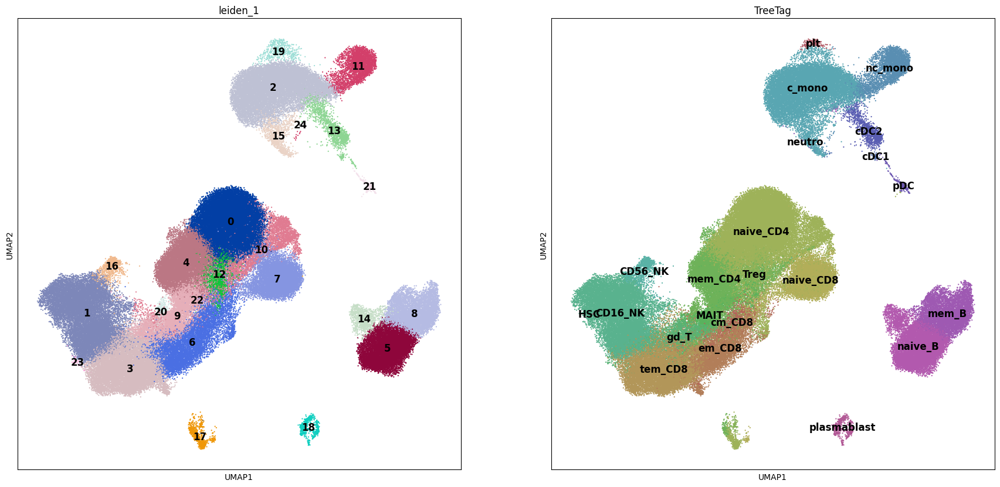

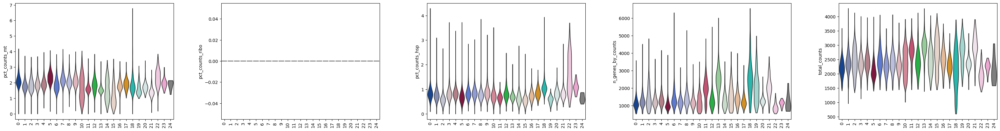

In [ ]:
  plt.rcParams['figure.figsize'] = (10, 10)
  sc.pl.umap(adata, color=['leiden_1','TreeTag'],legend_loc='on data', size=10,legend_fontsize=12)
  plt.rcParams['figure.figsize'] = (6, 5)
  sc.pl.violin(
      adata=adata,
      keys=['pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hsp', 'n_genes_by_counts', 'total_counts'],
      groupby='leiden_1', stripplot=False, jitter=False, rotation=90)

### Apply QC

In [ ]:
## filter non-cells
print ("Before: "); print (adata.shape)
sc.pp.filter_cells(adata, min_genes=300)
print ("After: "); print (adata.shape)


In [ ]:
# QC subset-------------------------------------------------

# Define QC filters
qc_pass = (
    (adata.obs['pct_counts_mt'] <= 2.75) &
    (adata.obs['pct_counts_ribo'] >= 7) &
    (adata.obs['pct_counts_hsp'] <= 1.5) &
    (adata.obs['n_genes_by_counts'] >= 800) &
    (adata.obs['total_counts'] >= 1500)
    )

# Before / After counts
total_before = adata.n_obs
total_after = qc_pass.sum()

# Counts per TreeTag category
before_counts = adata.obs['leiden_2'].value_counts().sort_index()
after_counts = (
    adata.obs.loc[qc_pass, 'leiden_2']
    .value_counts()
    .reindex(before_counts.index)
    .fillna(0)
    .astype(int))

# Create and print report
report = pd.DataFrame({
    'before': before_counts,
    'after': after_counts,
    'retained_%': (after_counts / before_counts * 100).round(2).astype(str) + '%'
})

print(f'Total cells before QC: {total_before:,}')
print(f'Total cells after QC: {total_after:,} ({total_after / total_before:.1%} retained)\n')
print(report)

# Confirm before subsetting
confirm = input('\nProceed with QC subset? (y/n): ')

if confirm.lower() == 'y':
    adata = adata[qc_pass].copy()
    print('\nQC filtering applied and data subsetted.')
else:
    print('\nQC filtering not applied. Data remains unchanged.')



## Tweaks

### adata

In [ ]:
adata

### Recompute clusters

In [ ]:
  # sc.pp.neighbors(adata, use_rep='X_pca_harmony'),
  # sc.tl.umap(adata)
  sc.tl.leiden(adata, resolution=3, key_added='leiden_3',flavor = 'igraph',n_iterations=1)

### Remove non-coding genes

In [ ]:
# Remove non-coding genes
gc.collect()
print (adata.shape)
# Ensure var_names are unique before calling coding_genes
adata.var_names_make_unique()
adata = coding_genes (adata)
print (adata.shape)

In [ ]:
# Load backed adata into memory
adata = adata.to_memory()
print(f"adata loaded into memory. Shape: {adata.shape}")

In [ ]:
# Rename gene
adata.var_names = adata.var_names.to_series().replace({"FOXP3_1": "FOXP3"})

### Delete cell categories

In [ ]:
  # adata = adata[~adata.obs['author_cell_type'].str.endswith('-Doublet')].copy()
  # adata = adata[adata.obs['leiden_1'].isin(['5'])].copy() # retain
  # adata = adata[~adata.obs['leiden_1'].isin(['11'])].copy() # remove
  adata = adata[~adata.obs['TreeTag'].isin(['plt'])].copy() # remove

### split into dictionary

In [ ]:
adata_full=adata
adata_dict = split(adata, category = 'TreeTag', min_cells=30)
adata = adata_dict ['T_NK']

### Check shape

In [ ]:
print(f"Shape of adata.X: {adata.X.shape}")
if adata.raw is None:
    print("adata.raw is None. Raw data is not available.")
else:
    print(f"Shape of adata.raw.X: {adata.raw.X.shape}")

### Pull X from raw

In [ ]:
adata = restore_from_raw(adata)

### Pull raw from X

In [ ]:
def has_nans(X):
    if sp.issparse(X):
        # Convert only the data (non-zero entries) to dense array for NaN check
        return np.isnan(X.data).any()
    else:
        return np.isnan(X).any()

if has_nans(adata.X):
    print("⚠️ Warning: adata.X contains NaNs. Don't set this as raw.")
else:
    adata.raw = adata.copy()
    print("✅ adata.raw set successfully.")

### Remove unused categories

In [ ]:
adata.obs['TreeTag'] = adata.obs['TreeTag'].cat.remove_unused_categories()

### Merge datasets

In [ ]:
def merge_ds(adata, adata):
    import pandas as pd

    adata.obs_names_make_unique()
    adata.obs_names_make_unique()

    adata.obs['dataset_origin'] = 'A'
    adata.obs['dataset_origin'] = 'H'

    adata.obs = adata.obs.rename(columns={
        'Sample_ID': 'sample',
        'COND': 'condition'
    })

    # Ensure existence and fill where missing (with categorical safety)
    if 'condition' not in adata.obs:
        adata.obs['condition'] = 'T1D'
    elif pd.api.types.is_categorical_dtype(adata.obs['condition']):
        adata.obs['condition'] = adata.obs['condition'].cat.add_categories(['T1D'])
        adata.obs['condition'] = adata.obs['condition'].fillna('T1D')
    else:
        adata.obs['condition'] = adata.obs['condition'].fillna('T1D')

    if 'treatment' not in adata.obs:
        adata.obs['treatment'] = 'untreated'
    elif pd.api.types.is_categorical_dtype(adata.obs['treatment']):
        adata.obs['treatment'] = adata.obs['treatment'].cat.add_categories(['untreated'])
        adata.obs['treatment'] = adata.obs['treatment'].fillna('untreated')
    else:
        adata.obs['treatment'] = adata.obs['treatment'].fillna('untreated')

    # Ensure both have all required obs columns
    for col in ['sample', 'treatment', 'condition']:
        if col not in adata.obs:
            adata.obs[col] = pd.NA
        if col not in adata.obs:
            adata.obs[col] = pd.NA

    # Outer join on genes
    adata = ad.concat(
        [adata, adata],
        axis=0,
        join='outer',
        merge='same',
        index_unique='-'
    )

    # Fill NaNs after concat
    for col, fill_val in [('condition', 'T1D'), ('treatment', 'untreated')]:
        if pd.api.types.is_categorical_dtype(adata.obs[col]):
            if fill_val not in adata.obs[col].cat.categories:
                adata.obs[col] = adata.obs[col].cat.add_categories([fill_val])
        adata.obs[col] = adata.obs[col].fillna(fill_val)

    # New group column
    adata.obs['group'] = (
        adata.obs['condition'].astype(str) + "_" + adata.obs['treatment'].astype(str)
    )

    return adata

adata = merge_ds(adata, adata)

## Annotation

### DGE

In [ ]:

df = DGE(
    adata= adata,
    groupby='TreeTag',
    target_group=['naive_B'],
    reference_group="HPC",
    min_log2fc=0.4,
    min_delta_pct = 0.4,
    min_pct = 0.4,
    n_sample=10000,
    n_genes=20,
    return_df=True,
    direction = "pos"
)
display (df.head(100))

,gene,mean_target,mean_ref,pct_target,pct_ref,delta_pct,log2fc,pval,pval_adj
12,CD79A,2.58e+00,6.22e-02,9.59e-01,8.00e-02,8.79e-01,2.52e+00,0.00e+00,0.00e+00
0,CD83,2.67e+00,3.26e-01,9.74e-01,3.60e-01,6.14e-01,2.34e+00,0.00e+00,0.00e+00
6,EZR,2.70e+00,5.33e-01,9.80e-01,5.47e-01,4.33e-01,2.17e+00,0.00e+00,0.00e+00
2,HLA-DQB1,1.81e+00,2.82e-01,8.12e-01,2.67e-01,5.45e-01,1.53e+00,0.00e+00,0.00e+00
5,SNX9,1.84e+00,4.18e-01,8.70e-01,4.58e-01,4.12e-01,1.42e+00,0.00e+00,0.00e+00
1,HLA-DQA1,1.60e+00,4.01e-01,8.10e-01,4.04e-01,4.06e-01,1.20e+00,0.00e+00,0.00e+00
8,LINC00926,1.16e+00,1.71e-03,6.42e-01,4.44e-03,6.38e-01,1.16e+00,0.00e+00,0.00e+00
3,BACH2,1.23e+00,1.16e-01,6.89e-01,1.47e-01,5.42e-01,1.11e+00,0.00e+00,0.00e+00
9,ISG20,9.20e-01,8.75e-02,5.44e-01,1.02e-01,4.41e-01,8.33e-01,0.00e+00,0.00e+00
7,MS4A1,8.14e-01,5.30e-03,4.83e-01,1.33e-02,4.69e-01,8.09e-01,0.00e+00,0.00e+00


#### DotPlot and UMAPs

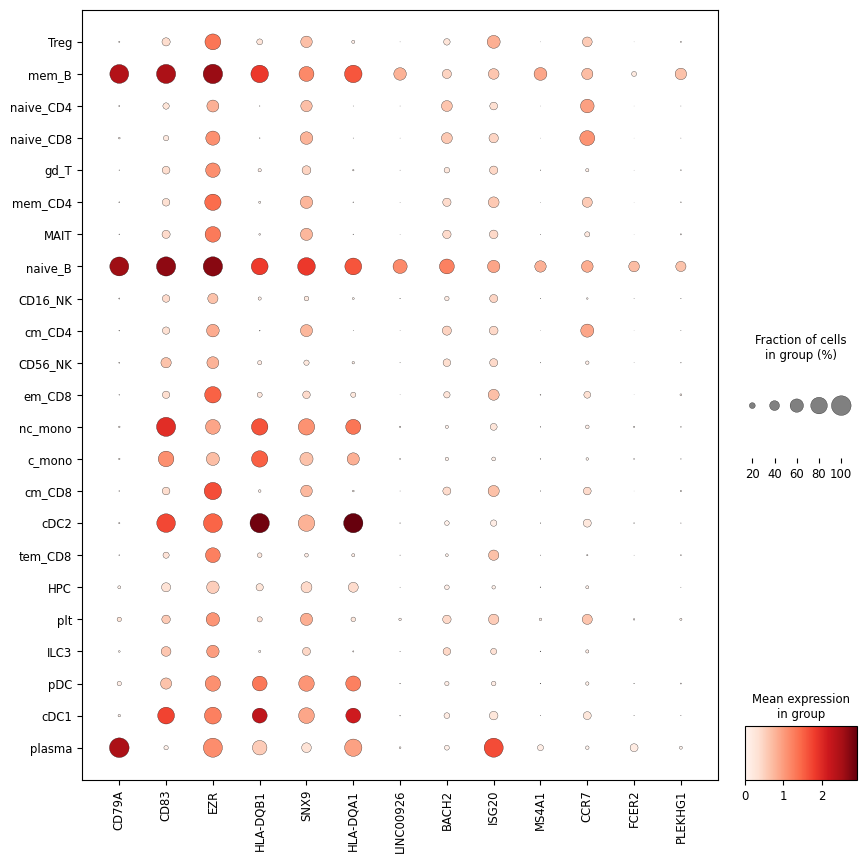

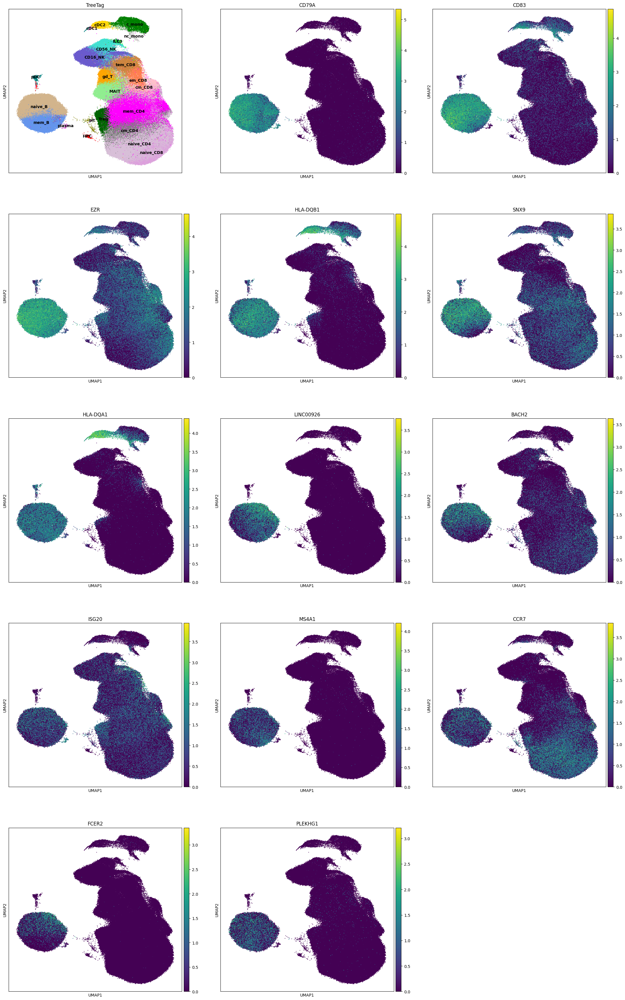

In [ ]:

genes = list (df.head(25)['gene'])
# genes = markers ('CD16_NK',adata=adata, sign = 'pos')
sc.pl.dotplot(adata,var_names=genes,groupby='TreeTag', standard_scale=None, figsize=(10, 10), cmap='Reds')
sc.pl.umap(
  adata=adata,
  color= ['TreeTag'] + genes,
  palette = set4,
  use_raw = True,
  sort_order = False,
  legend_loc='on data', legend_fontsize=10, legend_fontweight='bold',
  ncols=3, size=10, alpha=1,
  vmax= None,
  na_color='gray' # Explicitly set the missing value color
  )

In [ ]:
print (genes)

['FCER1A', 'CLEC10A', 'RNF130', 'CD1C', 'IFITM3', 'FCN1', 'CSTA', 'IGSF6', 'CASP1', 'ENHO', 'DOK2', 'PLD4', 'NCF2', 'CD1D', 'CLEC4A', 'FCGR2B']



#### Enrichment

In [ ]:
genes = df['gene']
results = enrich (genes, type = 'cell')
top50 = results.head(50)
display(top50)



,Library,Term,PValue,AdjustedPValue,OverlappingGenes
0,Azimuth_2023,Lung V2 (HLCA)-ann Level 4-CD4 T Cells,2.87e-17,1.47e-15,"IL32, CD2, CXCR4, LTB, CD3E, IL7R, CD3D"
1,Azimuth_2023,Lung V2 (HLCA)-ann Finest level-CD4 T Cells,2.87e-17,1.47e-15,"IL32, CD2, CXCR4, LTB, CD3E, IL7R, CD3D"
2,Azimuth_2023,Bone Marrow-L1-CD4 T,2.87e-17,1.47e-15,"LEF1, TCF7, CD3G, LTB, IL7R, CD3E, CD3D"
3,Azimuth_2023,Liver-L2-CD4 T,2.72e-14,8.39e-13,"CD2, IL32, LTB, CD69, CD3E, CD3D"
4,Azimuth_2023,Bone Marrow-L2-CD4 Memory,2.72e-14,8.39e-13,"TRAT1, RCAN3, LEF1, FLT3LG, IL7R, AQP3"
5,Azimuth_2023,PBMC-L1-CD4+ T Cell,1.63e-11,1.79e-10,"LDHB, MAL, CD3G, LTB, CD3D"
6,Azimuth_2023,Lung V2 (HLCA)-ann Level 4-CD8 T Cells,1.63e-11,1.79e-10,"CD2, IL32, CXCR4, CD3E, CD3D"
7,Azimuth_2023,PBMC-L2-CD4+ Naive T,1.63e-11,1.79e-10,"LDHB, LEF1, MAL, CCR7, IL7R"
8,Azimuth_2023,PBMC-L2-CD4+ Central Memory T,1.63e-11,1.79e-10,"IL32, LDHB, MAL, LTB, AQP3"
9,Azimuth_2023,PBMC-L3-CD4+ Naive T,1.63e-11,1.79e-10,"LDHB, TRAT1, LEF1, CCR7, IL7R"


#### ChatGPT query

In [ ]:

display (ChatGPT (genes, 'TILs', 'follicular lymphoma'))

In [ ]:
# prompt: form a new column called "treatment" which is equal "IL2" when timepoint is "D7" or 'D42' and equal 'none' when not

adata.obs['treatment'] = adata.obs['timepoint'].apply(lambda x: 'treated' if x in ['d7', 'd42'] else 'untreated')


### Show cell counts

In [ ]:
# Count cells per TreeTag
cell_counts_table = adata.obs['TreeTag'].value_counts().reset_index()
cell_counts_table.columns = ['TreeTag', 'Cell Count']

# Display as a nice table
display(cell_counts_table)


,TreeTag,Cell Count
0,naive_CD4,25227
1,CD16_NK,16080
2,c_mono,16038
3,tem_CD8,12885
4,naive_B,10993
5,naive_CD8,8236
6,mem_B,6950
7,Th2,5958
8,cm_CD4,5406
9,em_CD8,3991


### confusion matrix

In [ ]:
  # confusion matrix
  # purge(adata, 'Sample', min_count=10) # Removed as 'annotation' column is missing
  conf_mat = pd.crosstab(adata.obs['TreeTag'], adata.obs['leiden_1']) # Changed 'annotation' to 'leiden_1'
  # Step 2: Normalize rows to percentages
  conf_mat_percent = conf_mat.div(conf_mat.sum(axis=1), axis=0) * 100
  fig = plt.figure(figsize=(10, 12))
  sns.set(font_scale=1.4)
  sns.heatmap(conf_mat_percent, annot=True, fmt='.1f', cmap='Reds')
  plt.xticks(rotation=45, ha='right')
  plt.show()

In [ ]:
gc.collect()

185521

### Run pipeline

In [ ]:
if (adata.raw.X.shape != adata.X.shape):
  adata = restore_from_raw(adata)
# sc.pp.normalize_total(adata=adata, target_sum=1e4)
# sc.pp.log1p(adata)
# adata = convert (adata)
# adata = coding_genes (adata)
# adata.obs_names_make_unique()
adata = pipeline (adata, harmony=True, sample_key = 'sample',  n_top_genes=1000, downsample_n = 1000 )

🔄 Starting pipeline…
❌ Less than 10% of sampled genes matched Ensembl or Entrez formats. No conversion performed.
📉 Step 1: Downsampling to 1000 cells…
🧹 Step 2: Filtering zero‐sum genes…
   → 18191 → 18186 genes kept.
⏭️ Step 3: Skipping alias conversion.
Step 4: Normalizing & log1p…
   - full already transformed
   - subset already transformed
💾 Step 4b: Cached normalized+log1p data in adata.raw.
✨ Step 5: Selecting HVGs…


/usr/local/lib/python3.11/dist-packages/legacy_api_wrap/__init__.py:82: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


   → Excluding BCR/TCR; 876 HVGs remain.


### Run TreeTag

In [ ]:
TreeTag (adata=adata, ontology_yaml='ontology.yaml', # 'coarse.yaml','ontology_TIL.yaml','ontology.yaml'
                markers_yaml='markers.yaml', smoothing = True, verbose = True,
                majority_vote=False, root = 'leukocyte', min_score = 0,
                save_scores= False, prune = False, min_diff=0.1)
plt.rcParams['figure.figsize'] = (8, 8)
sc.pl.umap(
  adata=adata,
  color=  'TreeTag',
  # palette = set4, alpha=1,
  palette  = palette_from_graph(G, root="leukocyte", saturation=0.5, brightness=0.7),
  legend_loc='on data', legend_fontsize=9, legend_fontweight='regular',
  use_raw = True, size = 2, ncols= 3)

[TreeTag] split @ 'leukocyte' (cells=408234, X_used=408234x44, score=0.96s, children_scored=5)
[TreeTag] split @ 'T_NK' (cells=347914, X_used=347914x17, score=0.60s, children_scored=2)
[TreeTag] split @ 'T' (cells=312262, X_used=312262x20, score=0.59s, children_scored=3)
[TreeTag] split @ 'ILT' (cells=44567, X_used=44567x21, score=0.06s, children_scored=2)
[TreeTag] split @ 'CD4' (cells=212405, X_used=212405x19, score=0.34s, children_scored=3)
[TreeTag] split @ 'LN_homing_CD4' (cells=130569, X_used=130569x12, score=0.19s, children_scored=2)
[TreeTag] split @ 'CD8' (cells=55290, X_used=55290x14, score=0.08s, children_scored=2)
[TreeTag] split @ 'mem_CD8' (cells=33749, X_used=33749x16, score=0.05s, children_scored=3)
[TreeTag] split @ 'ILC' (cells=35652, X_used=35652x29, score=0.06s, children_scored=3)
[TreeTag] split @ 'B' (cells=50916, X_used=50916x21, score=0.08s, children_scored=2)
[TreeTag] split @ 'CD19_B' (cells=50818, X_used=50818x25, score=0.08s, children_scored=2)
[TreeTag] spl

ValueError: no such vertex: 'leukocyte'

## visualizations

In [ ]:
import colorsys



    # --- HSV→hex at midpoint hue ---
    def hsv_hex(h, s, v):
        r, g, b = colorsys.hsv_to_rgb(h % 1.0, max(0,min(1,s)), max(0,min(1,v)))
        return "#{:02X}{:02X}{:02X}".format(int(round(r*255)), int(round(g*255)), int(round(b*255)))

    out = {}
    for vid, (h0, h1) in intervals.items():
        if leaves_only and G.outdegree(vid) > 0:
            continue
        out[G.vs[vid]["name"]] = hsv_hex((h0 + h1) / 2.0, saturation, brightness)
    return out


In [ ]:
adata

AnnData object with n_obs × n_vars = 136408 × 824
    obs: 'gsm_id', 'sample_id', 'replicate', 'source_file', 'batch', 'leiden_1', 'FastTag', 'cell_state_score', 'stress_score', 'prolif_score', 'apoptosis_score', 'autophagy_score', 'activation_score', 'immunosuppression_score', 'cytotoxicity_score', 'IFN_res_score', 'IL2_res_score', 'T_NK_score', 'T_score', 'ab_T_score', 'MAIT_score', 'CD4_score', 'c_CD4_score', 'LN_homing_CD4_score', 'naive_CD4_score', 'cm_CD4_score', 'mem_CD4_score', 'Th1_score', 'Th17_score', 'Th2_score', 'Tfh_score', 'Treg_score', 'CD8_score', 'naive_CD8_score', 'mem_CD8_score', 'cm_CD8_score', 'em_CD8_score', 'tem_CD8_score', 'gd_T_score', 'NK_score', 'CD16_NK_score', 'CD56_NK_score', 'ILC_score', 'ILC3_score', 'root_score', 'B_score', 'myelo_score', 'HSC_score', 'MEP_score', 'plt_score', 'ILT_score', 'act_CD4_score', 'ifn_CD4_score', 'act_CD8_score', 'CD19_B_score', 'plasma_score', 'circ_B_score', 'naive_B_score', 'mem_B_score', 'plasmablast_score', 'MPC_score', 

In [ ]:
from google.colab import files; files.view("/content/ontology.yaml")

<IPython.core.display.Javascript object>

### UMAP

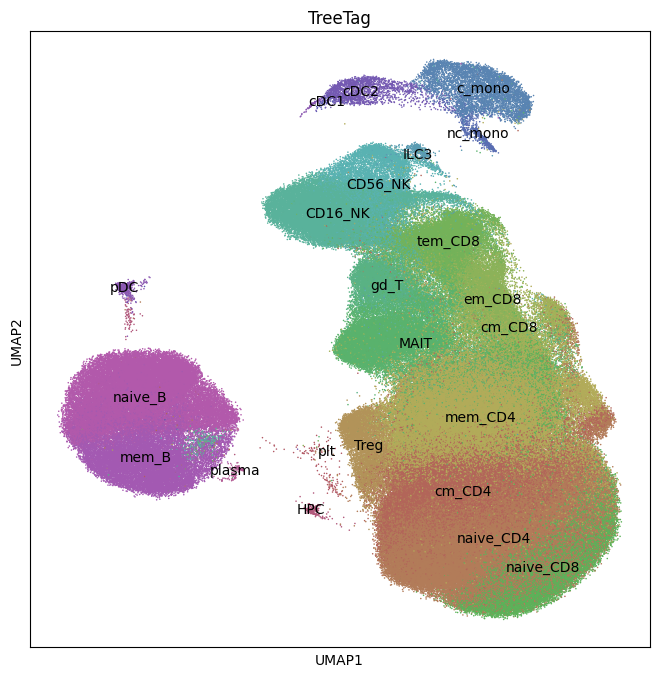

In [ ]:
# draw without rasterized to avoid the bug
fig = sc.pl.umap(
    adata,
    color='TreeTag',
    # color = markers ('HPC'),
    # color = ['MAIT_score'],
    use_raw=True,
    # palette=set4,
    palette  = palette_from_graph(G, root="leukocyte", saturation=0.5, brightness=0.7),
    size=5,
    alpha=None,       # transparency off = faster
    show=True,
    legend_loc='on data',
    legend_fontweight = 'regular',
    ncols=3
)

# # post-hoc: rasterize all point collections (keeps axes as vector in PDF/SVG)
# for ax in fig.axes:
#     for coll in getattr(ax, "collections", []):
#         coll.set_rasterized(True)

### Plot ontology

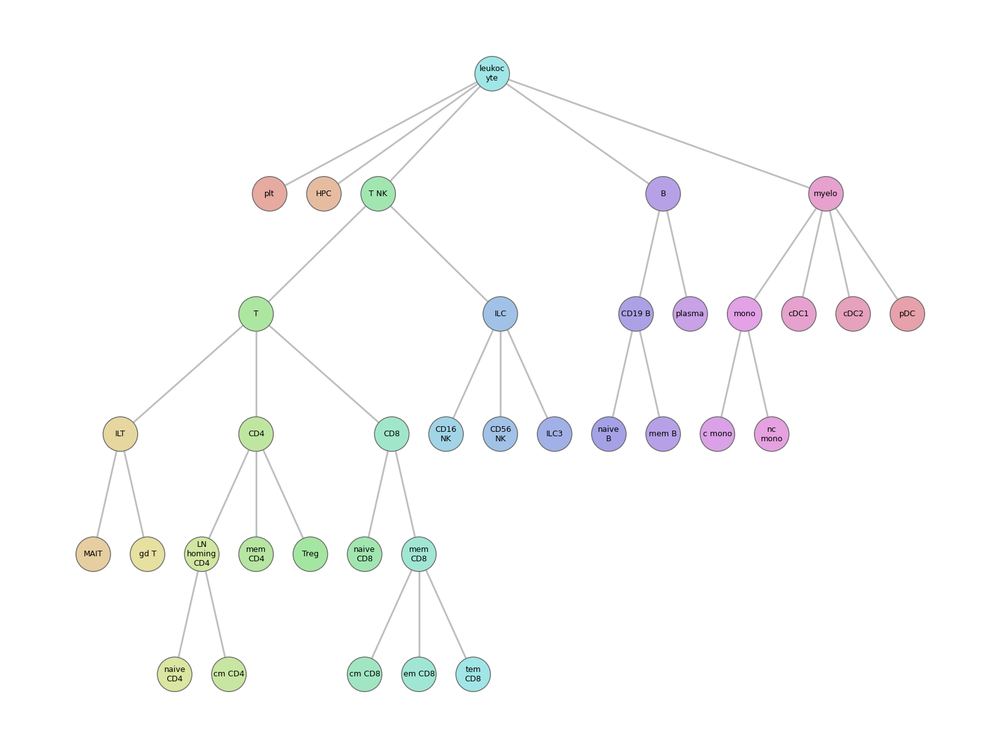

In [118]:
G, normalized_markers = init_ontology('ontology.yaml', 'markers.yaml', root='leukocyte')
palette = palette_from_graph(G, root="leukocyte", saturation=0.3, brightness=0.9, order = 'ID')
plot_ontology(G, root='leukocyte', vertex_size=55, vertex_label_size=9, bbox=(1600,1200), palette=palette)

### Dot Plot

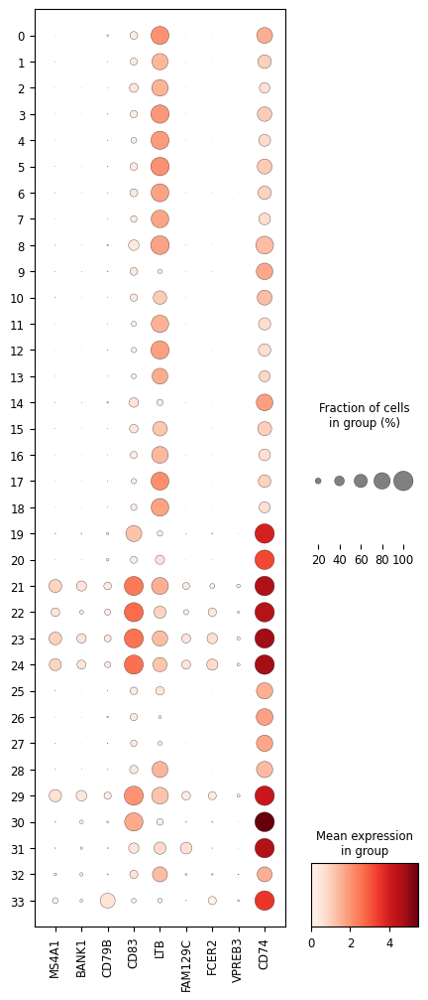

In [ ]:
# Dot Plot
genes = markers ('CD19_B')
# Convert 'week' to string to avoid potential interval issues in dotplot
# adata.obs['week_str'] = adata.obs['week'].astype(str)

sc.pl.dotplot(adata, vmax= None,
              var_names=genes,
              groupby='leiden_2', # Use the new string column for grouping
              standard_scale=None,  dendrogram=False, use_raw=True, figsize=(5, 12))

### Remove doublets

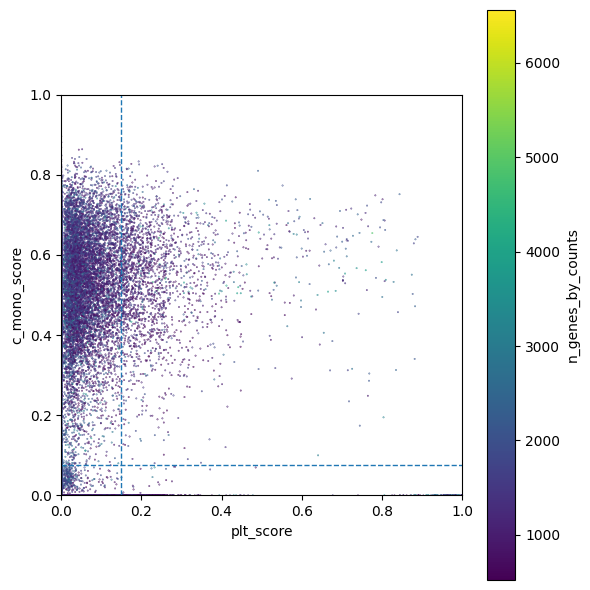

In [ ]:
x_name = "plt_score"
y_name = "c_mono_score"
x = adata.obs[x_name]
y = adata.obs[y_name]
c = adata.obs["n_genes_by_counts"]

plt.figure(figsize=(6,6))
plt.scatter(x, y, c=c, s=0.1, alpha=1) # Removed 'sc =' from this line
plt.colorbar(label="n_genes_by_counts") # Removed 'sc' from this line
plt.axvline(0.15, ls="--", lw=1)  # threshold line
plt.axhline(0.075, ls="--", lw=1)
plt.xlabel(xlabel=x_name)
plt.ylabel(y_name)
plt.xlim(0,1)
plt.ylim(0,1)
plt.gca().set_aspect("equal", "box")
plt.tight_layout()
plt.show()

if False:
  adata = adata[~((adata.obs[x_name] > 0.075) & (adata.obs[y_name] > 0.15))].copy()

### Movie frames

In [ ]:
import colorsys

def _leaf_counts(G, r):
    cnt = [0]*G.vcount()
    def dfs(u):
        kids = G.successors(u)
        if not kids: cnt[u] = 1
        else:        cnt[u] = sum(dfs(k) for k in kids)
        return cnt[u]
    dfs(r); return cnt

def compute_intervals(G, root, order="size"):
    """Final tree → {vid: (h0,h1)} intervals; stable across all frames."""
    r = G.vs.find(name=root).index
    cnt = _leaf_counts(G, r)
    intervals = {}
    def assign(u, h0, h1):
        intervals[u] = (h0, h1)
        kids = G.successors(u)
        if not kids: return
        if order == "size":
            kids = sorted(kids, key=lambda k: (-cnt[k], G.vs[k]["name"]))
        else:
            kids = sorted(kids, key=lambda k: G.vs[k]["name"])
        tot = sum(cnt[k] for k in kids) or len(kids)
        cur = h0
        for k in kids:
            frac = (cnt[k]/tot) if tot else 1/len(kids)
            nxt = cur + (h1-h0)*frac
            assign(k, cur, nxt); cur = nxt
    assign(r, 0.0, 1.0)
    return intervals

def visible_nodes_for_stage(G, root, expanded:set[str]):
    """
    ‘expanded’ = node names you chose to split open in this frame.
    Returns the frontier nodes to draw (coarse partition).
    """
    r = G.vs.find(name=root).index
    vis = []
    def walk(u):
        name = G.vs[u]["name"]
        kids = G.successors(u)
        if not kids or name in expanded:
            for k in kids: walk(k)   # expanded → show children
        else:
            vis.append(u)            # not expanded → keep as one node
    walk(r)
    return vis

def hsv_hex(h, s, v):
    r,g,b = colorsys.hsv_to_rgb(h%1.0, max(0,min(1,s)), max(0,min(1,v)))
    return "#{:02X}{:02X}{:02X}".format(int(round(r*255)), int(round(g*255)), int(round(b*255)))

def palette_for_stage(G, intervals, nodes, saturation=0.7, brightness=0.95):
    """Map visible node names → hex, using interval midpoints (stable)."""
    out = {}
    for vid in nodes:
        h0,h1 = intervals[vid]
        out[G.vs[vid]["name"]] = hsv_hex((h0+h1)/2, saturation, brightness)
    return out


In [ ]:
# ---- stable palette from igraph tree (leaf-proportional hue) ----
import colorsys

def _palette_from_graph(G, root, saturation=0.70, brightness=0.95, order="size"):
    r = G.vs.find(name=root).index
    cnt = [0]*G.vcount()
    def dfs(u):
        kids = G.successors(u)
        cnt[u] = 1 if not kids else sum(dfs(v) for v in kids)
        return cnt[u]
    dfs(r)
    intervals = {}
    def assign(u, h0, h1):
        intervals[u] = (h0, h1)
        kids = G.successors(u)
        if not kids: return
        kids = sorted(
            kids,
            key=(lambda k: (-cnt[k], G.vs[k]["name"])) if order == "size" else (lambda k: G.vs[k]["name"])
        )
        tot = sum(cnt[k] for k in kids) or len(kids)
        cur = h0
        for k in kids:
            frac = cnt[k] / tot
            nxt = cur + (h1 - h0) * frac
            assign(k, cur, nxt)
            cur = nxt
    assign(r, 0.0, 1.0)

    def hsv_hex(h, s, v):
        r, g, b = colorsys.hsv_to_rgb(h % 1.0, max(0, min(1, s)), max(0, min(1, v)))
        return "#{:02X}{:02X}{:02X}".format(int(round(r*255)), int(round(g*255)), int(round(b*255)))

    return {G.vs[i]["name"]: hsv_hex((h0+h1)/2, saturation, brightness) for i, (h0, h1) in intervals.items()}


def TreeTag_frames(
    adata,
    ontology_yaml: str,
    markers_yaml: str,
    root: str,
    frames_dir: str = "treetag_frames",
    size: float = 4.0,
    legend_fontsize: float = 9,
    legend_fontweight: str = "regular",
    palette_s: float = 0.70,
    palette_v: float = 0.95,
    smoothing: bool = True,
    pre_scale: bool = True,
    verbose: bool = True,
    annot_xy: tuple[float, float] = (0.03, 0.97),   # left/top by default
    order: str = "size",                            # palette sibling order: "size" or "name"
    majority_vote: bool = True,                     # final MV step (timed & reported)
):
    """
    Progressive TreeTag:
      - After each split, update labels and save a PNG of the UMAP.
      - Stable colors computed once from the final tree.
      - On-frame annotation (left) shows cumulative compute time (excludes render/save) and split@node.
      - Optional final majority-vote over kNN graph (timed + reported) with an extra frame saved.

    Requires: an external `init_ontology(ontology_yaml, markers_yaml, root)` returning (G, marker_dict).
    """
    import os, time
    import numpy as np
    import pandas as pd
    import scanpy as sc
    from hashlib import blake2b
    from scipy.sparse import csc_matrix, csr_matrix, coo_matrix, dia_matrix, issparse

    t0_all = time.perf_counter()
    os.makedirs(frames_dir, exist_ok=True)

    # 1) Ontology + markers
    G, marker_dict = init_ontology(ontology_yaml, markers_yaml, root=root)  # noqa: F821 (provided by caller)
    use_raw = adata.raw is not None
    var_names = (adata.raw.var_names if use_raw else adata.var_names)
    valid = set(var_names)

    def _norm(md):
        out = {}
        for node, val in md.items():
            if isinstance(val, dict):
                pos = [g for g in val.get("pos", []) if g in valid]
                neg = [g for g in val.get("neg", []) if g in valid]
            else:
                pos = [g for g in val if not str(g).startswith("-") and g in valid]
                neg = [str(g)[1:] for g in val if str(g).startswith("-") and str(g)[1:] in valid]
            out[node] = {"pos": pos, "neg": neg}
        return out

    markers = _norm(marker_dict)
    ont_nodes = set(G.vs["name"])
    markers = {n: m for n, m in markers.items() if n in ont_nodes}

    # 2) Stable palette (no color jumps across frames)
    palette_dict = _palette_from_graph(G, root, saturation=palette_s, brightness=palette_v, order=order)

    # 3) Marker CSC cache (float32)
    marker_union = sorted({g for m in markers.values() for g in (m["pos"] + m["neg"])})

    def _hash_names(names):
        h = blake2b(digest_size=16)
        for s in names:
            h.update(str(s).encode("utf-8"))
            h.update(b"\0")
        return h.hexdigest()

    cache = adata.uns.get("_treetag_cache", {})
    want_meta = {
        "n_obs": int(adata.n_obs), "use_raw": bool(use_raw),
        "union_hash": _hash_names(marker_union), "version": 1,
        "dtype": "float32", "format": "csc"
    }
    X_csc = cache.get("X_csc"); have = cache.get("meta")
    if not (have == want_meta and X_csc is not None and issparse(X_csc)
            and getattr(X_csc, "format", "") == "csc"
            and X_csc.dtype == np.float32
            and X_csc.shape == (adata.n_obs, len(marker_union))):
        col_map = {g: i for i, g in enumerate(var_names)}
        cols = [col_map[g] for g in marker_union]
        Xsrc = (adata.raw.X if use_raw else adata.X)
        X_mark = Xsrc[:, cols]
        X_csc = X_mark if (issparse(X_mark) and X_mark.format == "csc") else csc_matrix(X_mark)
        if X_csc.dtype != np.float32:
            X_csc = X_csc.astype(np.float32)
        adata.uns["_treetag_cache"] = {"X_csc": X_csc, "meta": want_meta}
        if verbose:
            print(f"[TreeTag_frames] prepared marker CSC in {time.perf_counter()-t0_all:.2f}s "
                  f"(cells={X_csc.shape[0]}, genes={X_csc.shape[1]})")
    g2col = {g: i for i, g in enumerate(marker_union)}

    # 4) Optional per-marker scaling by nonzero max
    scale_vec = None
    if pre_scale and len(marker_union):
        cache = adata.uns.setdefault("_treetag_cache", {})
        smeta = cache.get("scale_meta_max", {})
        want = {
            "n_obs": int(adata.n_obs), "use_raw": bool(use_raw),
            "union_hash": _hash_names(marker_union), "version": 1, "mode": "max_nonzero"
        }
        if smeta == want and "scale_vec_max" in cache and len(cache["scale_vec_max"]) == len(marker_union):
            scale_vec = cache["scale_vec_max"]
            if verbose:
                print("[TreeTag_frames] using cached pre-scale vector")
        else:
            indptr, data = X_csc.indptr, X_csc.data
            m = X_csc.shape[1]
            scale = np.ones(m, dtype=np.float32)
            for j in range(m):
                a = data[indptr[j]:indptr[j+1]]
                if a.size:
                    mx = a.max()
                    if mx > 1e-12:
                        scale[j] = np.float32(1.0/float(mx))
            scale_vec = scale
            cache["scale_vec_max"] = scale_vec
            cache["scale_meta_max"] = want
            adata.uns["_treetag_cache"] = cache

    # 5) Connectivities (row-normalized) for optional smoothing
    C_full = None
    if smoothing:
        conn_key = adata.uns.get("neighbors", {}).get("connectivities_key")
        if conn_key and conn_key in adata.obsp:
            C_full = adata.obsp[conn_key]
        elif "connectivities" in adata.obsp:
            C_full = adata.obsp["connectivities"]
        if C_full is not None and C_full.shape[0] == adata.n_obs:
            C_full = csr_matrix(C_full)
            rs = np.array(C_full.sum(axis=1)).ravel()
            rs[rs == 0] = 1.0
            C_full = C_full.multiply((1.0/rs)[:, None]).tocsr()
        else:
            C_full = None
            if verbose:
                print("[TreeTag_frames] no usable connectivities → smoothing off")

    def _children(node_name):
        return [G.vs[i]["name"] for i in G.successors(G.vs.find(name=node_name)) if i is not None]

    # Per-node weight cache
    node_cache = {}
    def _prepare_node(node, kids):
        if node in node_cache:
            return node_cache[node]
        used_cols, seen = [], set()
        child_list, pos_lists, neg_lists = [], [], []
        for c in kids:
            pidx = [g2col[g] for g in markers.get(c, {}).get("pos", []) if g in g2col]
            nidx = [g2col[g] for g in markers.get(c, {}).get("neg", []) if g in g2col]
            if not pidx:  # require at least one + marker
                continue
            child_list.append(c)
            pos_lists.append(pidx)
            neg_lists.append(nidx)
            for gidx in pidx + nidx:
                if gidx not in seen:
                    seen.add(gidx); used_cols.append(gidx)
        if not child_list:
            node_cache[node] = dict(used_cols=[], child_list=[], W_pos=None, W_neg=None)
            return node_cache[node]
        local = {g: i for i, g in enumerate(used_cols)}
        data_p, rows_p, cols_p = [], [], []
        data_n, rows_n, cols_n = [], [], []
        for j, (pidx, nidx) in enumerate(zip(pos_lists, neg_lists)):
            if pidx:
                w = 1.0/float(len(pidx))
                rows_p.extend(local[g] for g in pidx); cols_p.extend([j]*len(pidx)); data_p.extend([w]*len(pidx))
            if nidx:
                w = 1.0/float(len(nidx))
                rows_n.extend(local[g] for g in nidx); cols_n.extend([j]*len(nidx)); data_n.extend([w]*len(nidx))
        n_local = len(used_cols)
        W_pos = coo_matrix((data_p, (rows_p, cols_p)), shape=(n_local, len(child_list))).tocsr()
        W_neg = coo_matrix((data_n, (rows_n, cols_n)), shape=(n_local, len(child_list))).tocsr() if data_n else None
        if pre_scale and scale_vec is not None and used_cols:
            import numpy as _np
            scl = _np.asarray(scale_vec, dtype=_np.float32)[used_cols]
            D = dia_matrix((scl, 0), shape=(n_local, n_local)).tocsr()
            W_pos = D @ W_pos
            if W_neg is not None:
                W_neg = D @ W_neg
        node_cache[node] = dict(used_cols=used_cols, child_list=child_list, W_pos=W_pos, W_neg=W_neg)
        return node_cache[node]

    def _score_children_rows(row_idx, node, kids):
        cache_local = _prepare_node(node, kids)
        used_cols, child_list, W_pos, W_neg = cache_local["used_cols"], cache_local["child_list"], cache_local["W_pos"], cache_local["W_neg"]
        if not child_list:
            return [], np.zeros((row_idx.size, 0), dtype=np.float32), 0
        X_used = X_csc[:, used_cols][row_idx, :].tocsr()
        P = X_used @ W_pos
        N = (X_used @ W_neg) if W_neg is not None else 0
        P = P.toarray() if hasattr(P, "toarray") else np.asarray(P)
        if hasattr(N, "toarray"): N = N.toarray()
        elif isinstance(N, int): pass
        else: N = np.asarray(N)
        Diff = P - (N if isinstance(N, int) else N)
        np.clip(Diff, 0, None, out=Diff)
        q1, q99 = np.quantile(Diff, 0.01, axis=0), np.quantile(Diff, 0.99, axis=0)
        S = (Diff - q1) / (q99 - q1 + 1e-9)
        np.clip(S, 0, 1, out=S)
        S = S.astype(np.float32, copy=False)
        if smoothing and C_full is not None and S.shape[1] > 0:
            C_sub = C_full[row_idx, :][:, row_idx].tocsr()
            C_sub.setdiag(0.0)
            rs = np.array(C_sub.sum(axis=1)).ravel(); rs[rs == 0] = 1.0
            C_sub = C_sub.multiply((1.0/rs)[:, None]).tocsr()
            S = C_sub @ S
        return cache_local["child_list"], S, len(used_cols)

    # 6) Progressive traversal and snapshots
    labels = np.array([root]*adata.n_obs, dtype=object)
    frame_id = 0
    algo_time_cum = 0.0   # excludes rendering/saving

    def _save_frame(tag_text, t_compute_cum):
        # temp obs + palette list aligned to current cats
        adata.obs["TreeTag_frame"] = pd.Categorical(labels)
        adata.obs["TreeTag_frame"] = adata.obs["TreeTag_frame"].cat.remove_unused_categories()
        cats = list(adata.obs["TreeTag_frame"].cat.categories)
        pal_list = [palette_dict.get(c, "#808080") for c in cats]

        fig = sc.pl.umap(
            adata, color="TreeTag_frame",
            palette=pal_list,
            legend_loc="on data", legend_fontsize=legend_fontsize, legend_fontweight=legend_fontweight,
            size=size, frameon=False, use_raw=False,
            title="", show=False, return_fig=True
        )
        # left-aligned, two lines
        fig.text(annot_xy[0], annot_xy[1], f"{tag_text}\n{t_compute_cum:.2f} s",
                 ha="left", va="top", fontsize=13)
        path = os.path.join(frames_dir, f"{frame_id:03d}_{tag_text.replace(' ','_')}.png")
        fig.savefig(path, dpi=200, bbox_inches="tight")
        return path

    def _walk(node, row_idx):
        nonlocal frame_id, algo_time_cum, labels
        kids = [k for k in _children(node) if k in markers]
        if not kids or row_idx.size == 0:
            labels[row_idx] = node
            return

        t_compute_start = time.perf_counter()
        child_names, S, n_local = _score_children_rows(row_idx, node, kids)
        if S.shape[1] == 0:
            labels[row_idx] = node
            return

        best = S.argmax(axis=1)
        for j, child in enumerate(child_names):
            m = (best == j)
            if m.any():
                labels[row_idx[m]] = child

        # compute-only time (before rendering)
        algo_time_cum += (time.perf_counter() - t_compute_start)

        # snapshot AFTER this split (rendering time excluded from annotation)
        frame_id += 1
        out_path = _save_frame(f"split@{node}", algo_time_cum)
        if verbose:
            print(f"[TreeTag_frames] split @{node}: cells={row_idx.size}, X_used={row_idx.size}x{n_local} → {out_path}")

        for j, child in enumerate(child_names):
            m = (best == j)
            if m.any():
                _walk(child, row_idx[m])

    _walk(root, np.arange(adata.n_obs, dtype=int))

    # ===== Final majority vote over neighbor graph (optional) =====
    if majority_vote and C_full is not None:
        t0_mv = time.perf_counter()
        C_mv = C_full.tocsr().copy()
        C_mv.setdiag(0.0)  # exclude self
        cats = pd.Categorical(labels)
        y = cats.codes.astype(np.int32)  # -1 shouldn't occur here
        K = len(cats.categories)
        n = y.shape[0]

        best_score = np.full(n, -1.0, dtype=np.float32)
        best_class = y.copy()
        for k in range(K):
            mask_k = (y == k).astype(np.float32)   # 0/1 indicator
            score_k = C_mv @ mask_k                # normalized neighbor vote for class k
            upd = score_k > best_score             # strict > keeps ties as original
            best_score[upd] = score_k[upd]
            best_class[upd] = k

        labels_mv = np.asarray(cats.categories, dtype=object)[best_class]
        changed = int(np.sum(labels_mv != labels))
        t_mv = time.perf_counter() - t0_mv
        algo_time_cum += t_mv

        if verbose:
            pct = (changed / float(n)) * 100.0 if n else 0.0
            print(f"[TreeTag_frames] majority_vote: changed={changed}/{n} ({pct:.2f}%), time={t_mv:.2f}s")

        # adopt MV labels, save a final post-MV frame
        labels = labels_mv
        frame_id += 1
        _save_frame("majority_vote", algo_time_cum)
    else:
        if verbose:
            why = "no connectivities" if C_full is None else "disabled"
            print(f"[TreeTag_frames] majority_vote skipped ({why})")

    if verbose:
        print(f"[TreeTag_frames] total wall={time.perf_counter()-t0_all:.2f}s; frames → '{frames_dir}'")


[TreeTag_frames] using cached pre-scale vector
[TreeTag_frames] split @leukocyte: cells=408234, X_used=408234x42 → frames_leukocyte/001_split@leukocyte.png
[TreeTag_frames] split @T_NK: cells=347914, X_used=347914x17 → frames_leukocyte/002_split@T_NK.png
[TreeTag_frames] split @T: cells=312263, X_used=312263x20 → frames_leukocyte/003_split@T.png
[TreeTag_frames] split @ILT: cells=44568, X_used=44568x21 → frames_leukocyte/004_split@ILT.png
[TreeTag_frames] split @CD4: cells=212405, X_used=212405x19 → frames_leukocyte/005_split@CD4.png
[TreeTag_frames] split @LN_homing_CD4: cells=130570, X_used=130570x12 → frames_leukocyte/006_split@LN_homing_CD4.png
[TreeTag_frames] split @CD8: cells=55290, X_used=55290x14 → frames_leukocyte/007_split@CD8.png
[TreeTag_frames] split @mem_CD8: cells=33749, X_used=33749x16 → frames_leukocyte/008_split@mem_CD8.png
[TreeTag_frames] split @ILC: cells=35651, X_used=35651x29 → frames_leukocyte/009_split@ILC.png
[TreeTag_frames] split @B: cells=50916, X_used=509

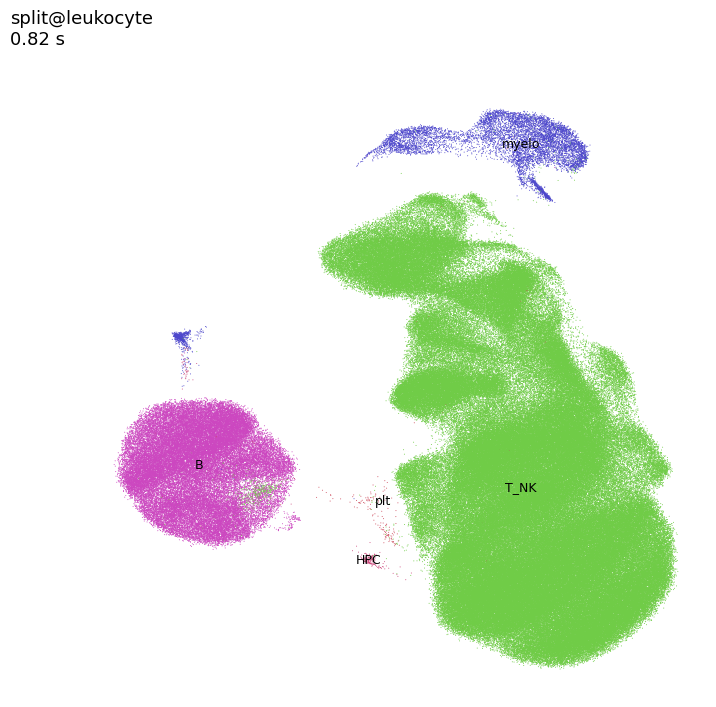

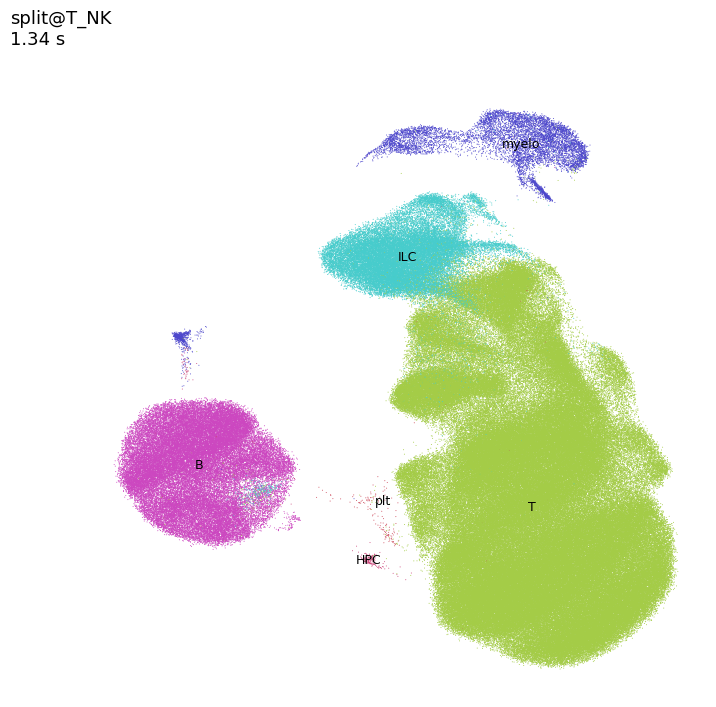

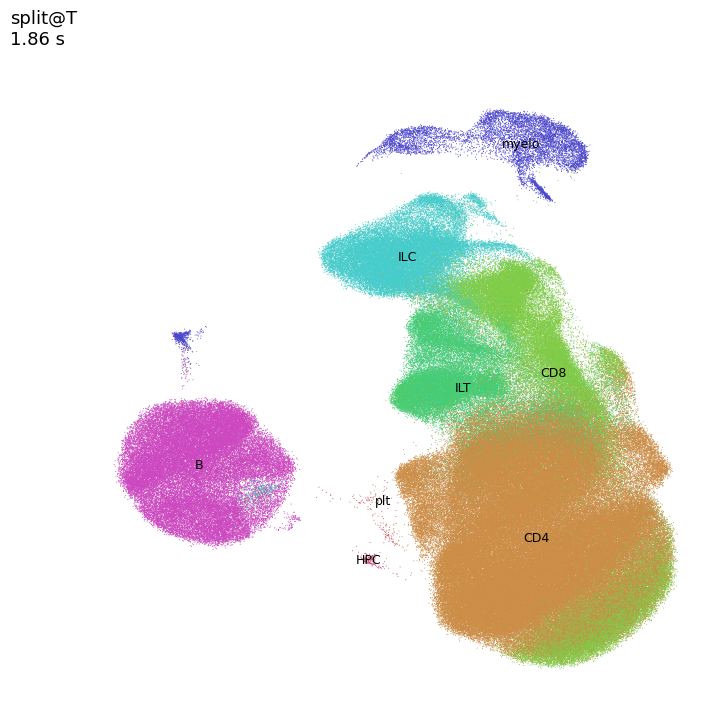

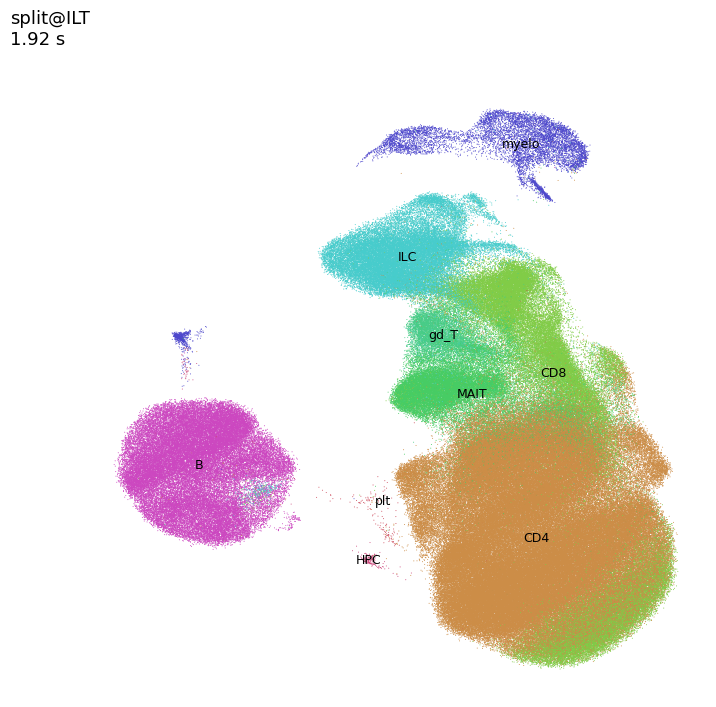

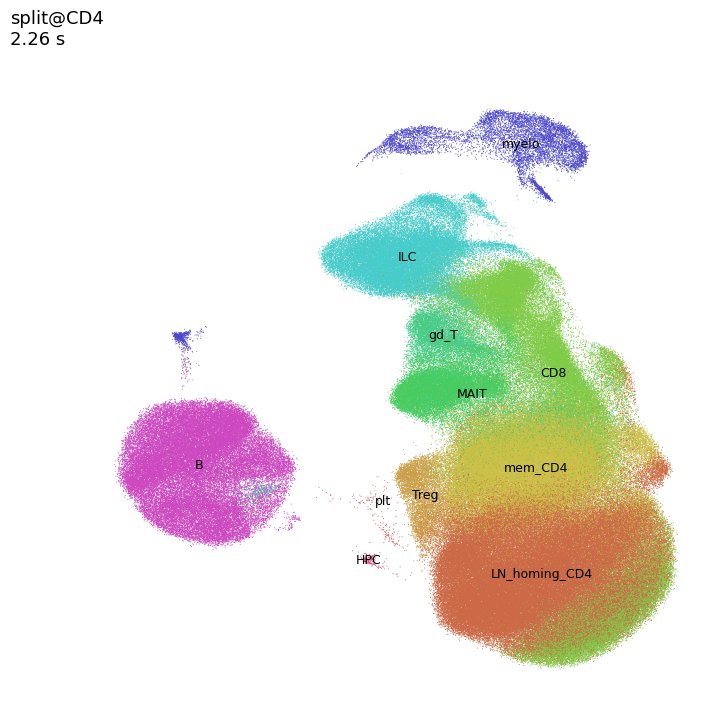

...

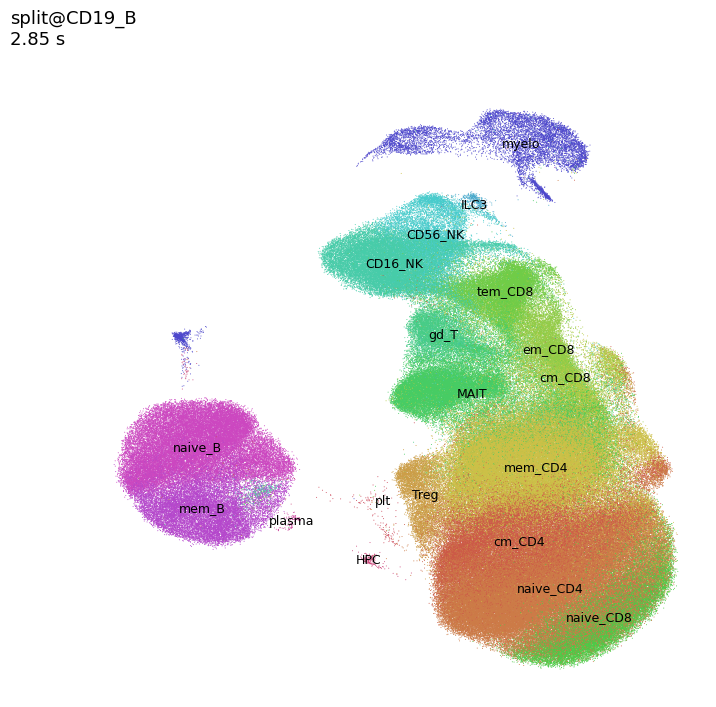

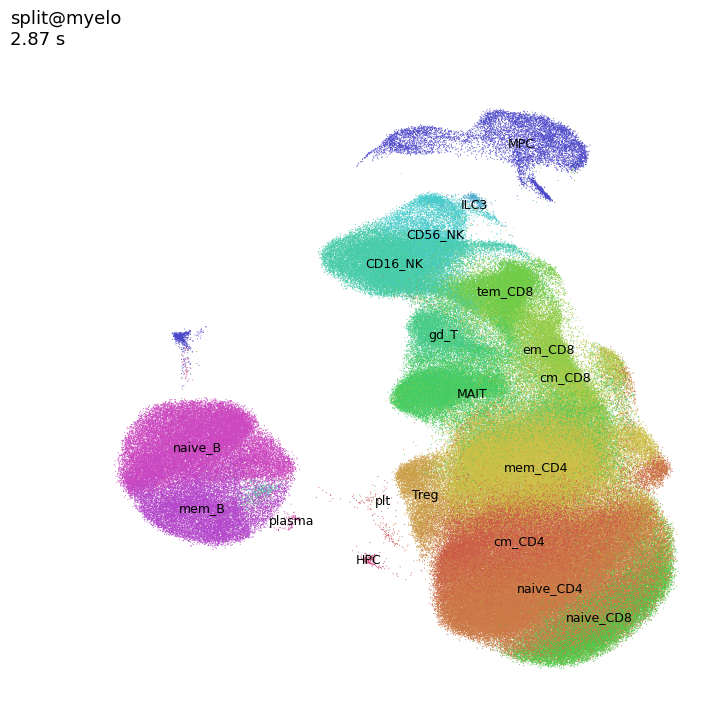

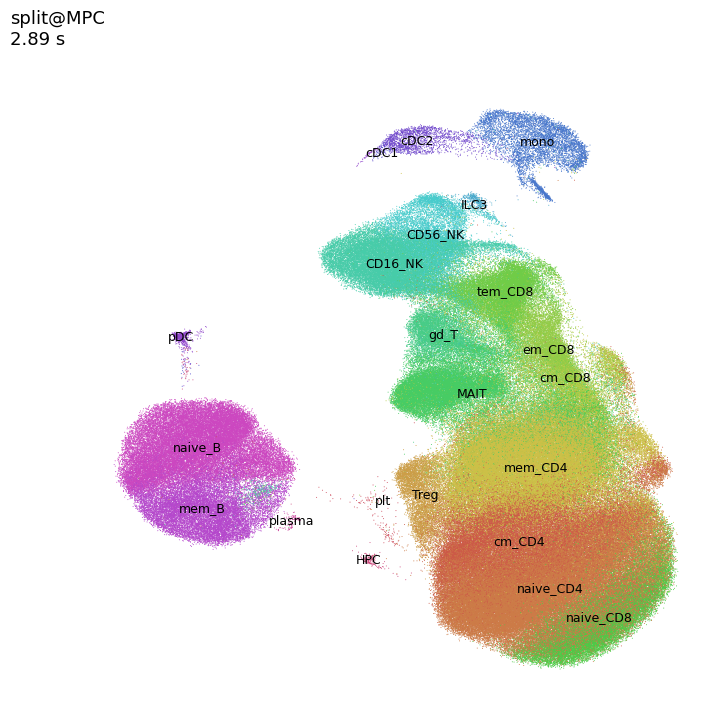

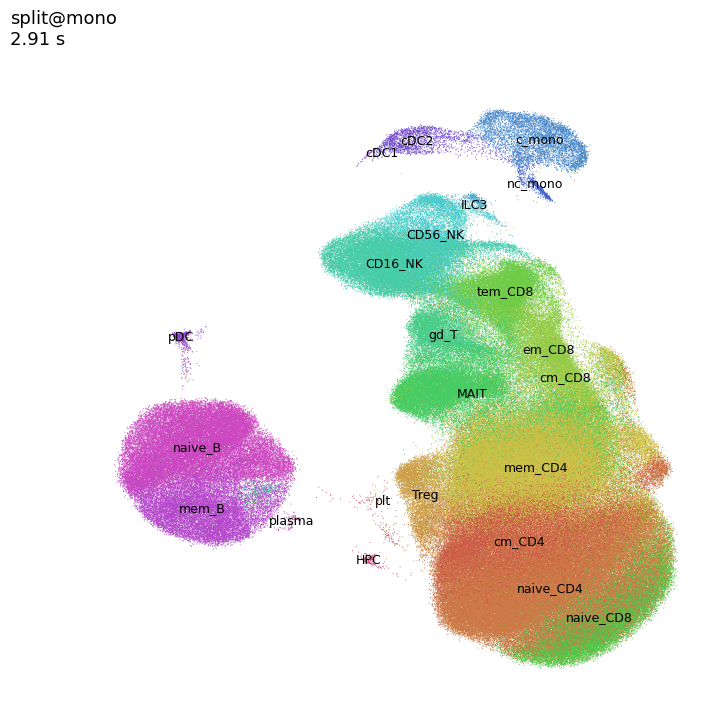

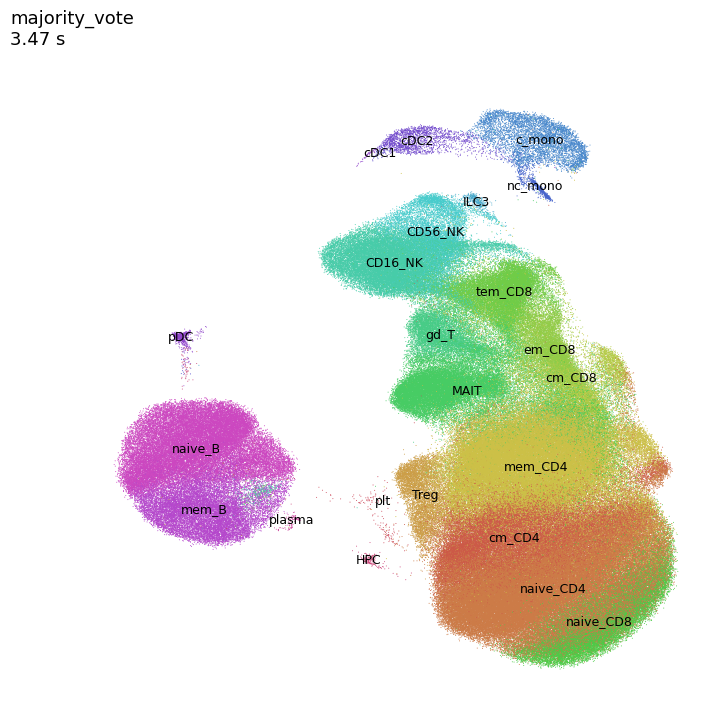

In [ ]:
TreeTag_frames(
    adata,
    ontology_yaml="ontology.yaml",
    markers_yaml="markers.yaml",
    root="leukocyte",
    frames_dir="frames_leukocyte",
    size=2,
    smoothing=True,         # same smoothing you use in TreeTag
    pre_scale=True,         # same sparse-friendly scaling
    palette_s=0.65, palette_v=0.8,
    verbose=True
)


In [ ]:
import shutil
from google.colab import files

shutil.make_archive("/content/frames_leukocyte", "zip", "/content/frames_leukocyte")  # makes /content/run_42.zip


'/content/frames_leukocyte.zip'

In [ ]:
def loop_scale(X_csc, thr=1e-12):
    indptr, data = X_csc.indptr, X_csc.data
    m = X_csc.shape[1]
    scale = np.ones(m, dtype=np.float32)
    for j in range(m):
        a = data[indptr[j]:indptr[j+1]]
        if a.size:
            mx = a.max()
            if mx > thr:
                scale[j] = np.float32(1.0/float(mx))
    return scale

def vec_scale(X_csc, thr=1e-12):
    mx = np.asarray(X_csc.max(axis=0)).ravel()
    scale = np.ones(mx.size, dtype=np.float32)
    np.divide(1.0, mx, out=scale, where=mx > thr)
    return scale

t0 = time.time(); s1 = loop_scale(X_csc); t1 = time.time()
t2 = time.time(); s2 = vec_scale(X_csc);  t3 = time.time()
print("loop:", t1-t0, "sec", "vec:", t3-t2, "sec", "equal:", np.allclose(s1,s2))


NameError: name 'X_csc' is not defined

## Save files

In [ ]:
# to Drive
adata.write ('Dong/Dong_T.h5ad') # save file

In [ ]:
# to google cloud

# adata.write ("/content/Dong.h5ad")
# blob = bucket.blob("Dong/Dong.h5ad")
# blob.upload_from_filename("/content/Dong.h5ad")
blob = bucket.blob("markers.yaml"); blob.upload_from_filename("markers.yaml")
blob = bucket.blob("ontology.yaml"); blob.upload_from_filename("ontology.yaml")
blob = bucket.blob("ontology_TIL.yaml"); blob.upload_from_filename("ontology_TIL.yaml")
blob = bucket.blob("coarse.yaml"); blob.upload_from_filename("coarse.yaml")
blob = bucket.blob("notes.txt"); blob.upload_from_filename("notes.txt")

In [ ]:
gc.collect()

0

In [ ]:
files.view("/content/")

<IPython.core.display.Javascript object>